In [1]:
import warnings
warnings.simplefilter(action="ignore")
# conda install -c conda-forge sweetviz 
!pip install sweetviz

     |████████████████████████████████| 15.1 MB 190 kB/s 


In [2]:
!pip install sweetviz

# Análisis Exploratório de Datos con Python/Pandas

_Python_ es un lenguaje de programación de alto nivel que se puede utilizar para realizar varias tareas. En este curso utilizaremos _Python_ y algunas de sus librerías para realizar actividades prácticas relacionadas con la Minería de Datos.

Una distribución de _Python_ gratuita (para uso individual) que es fácil de instalar y mantener es [Anaconda](https://www.anaconda.com/products/individual).

Si no puede instalar _Python_ en su máquina, puede usar una versión en línea como [Google Colab](https://colab.research.google.com)

Hoy usaremos la biblioteca [_Pandas_](https://pandas.pydata.org/), que es una biblioteca de análisis y manipulación de datos de código abierto rápida, potente, flexible y fácil de usar.

In [3]:
import pandas as pd # carregamento e manipulação de dados
import sweetviz as sv # ferramenta de análise exploratória
import seaborn as sns # gráficos
import matplotlib.pyplot as plt # gráficos
import numpy as np # processamento matemático
from scipy.stats import norm # normal

Comencemos cargando Pandas y la base de datos. Esta es una base para el pago de facturas en un restaurante y cuenta como atributos la factura total (total_bill), la propina (tip), el sexo del cliente que paga (sex), si la mesa estaba en un área de fumadores (smoker), el día de la semana (day) y la cantidad de personas en la mesa (size).

In [4]:
tips = pd.read_csv("Churn_Modelling.csv",index_col=0)

Podemos ver las primeras líneas del archivo usando la función `.head ()`

In [5]:
tips.head(10)

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0


Los últimos con la función `.tail ()`

In [6]:
tips.tail(10)

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
9991,15798964,Nkemakonam,714,Germany,Male,33,3,35016.60,1,1,0,53667.08,0
9992,15769959,Ajuluchukwu,597,France,Female,53,4,88381.21,1,1,0,69384.71,1
9993,15657105,Chukwualuka,726,Spain,Male,36,2,0.00,1,1,0,195192.40,0
9994,15569266,Rahman,644,France,Male,28,7,155060.41,1,1,0,29179.52,0
9995,15719294,Wood,800,France,Female,29,2,0.00,2,0,0,167773.55,0
9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


Y una muestra aleatoria con la función `.sample ()`

In [7]:
tips.sample(10)

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
2789,15726589,Matveyev,540,Germany,Male,39,1,82531.11,1,1,0,114092.52,0
5609,15605113,Sutherland,518,France,Female,27,1,133801.49,1,1,1,143315.57,0
4968,15743817,Hargreaves,621,Germany,Male,40,8,174126.75,3,1,0,172490.78,1
4713,15618774,White,474,France,Male,54,3,0.00,1,1,0,108409.17,1
3039,15807909,Rubensohn,744,France,Male,47,9,0.00,2,1,0,113163.17,0
2160,15641835,Anderson,683,France,Male,72,3,140997.26,1,0,1,52876.41,0
5208,15751022,Bowhay,777,Germany,Female,37,10,121532.17,2,1,1,73464.88,0
5537,15795878,Anayochukwu,636,Spain,Male,45,3,0.00,2,1,1,159463.80,0
6742,15730810,Storey,613,Spain,Male,44,9,100524.69,1,1,1,47298.95,0


O comando `.info()` mostra os atributos, e o tipos de cada atributo 

In [8]:
tips.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 1 to 10000
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CustomerId       10000 non-null  int64  
 1   Surname          10000 non-null  object 
 2   CreditScore      10000 non-null  int64  
 3   Geography        10000 non-null  object 
 4   Gender           10000 non-null  object 
 5   Age              10000 non-null  int64  
 6   Tenure           10000 non-null  int64  
 7   Balance          10000 non-null  float64
 8   NumOfProducts    10000 non-null  int64  
 9   HasCrCard        10000 non-null  int64  
 10  IsActiveMember   10000 non-null  int64  
 11  EstimatedSalary  10000 non-null  float64
 12  Exited           10000 non-null  int64  
dtypes: float64(2), int64(8), object(3)
memory usage: 1.1+ MB


El comando `.describe ()` devuelve algunas estadísticas descriptivas para atributos numéricos:

In [9]:
tips.describe()

,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


Echemos un vistazo a la distribución de la columna `total_bill`. Para facilitar la visualización, usaremos algunas bibliotecas de gráficos, como [`matplotlib`](https://matplotlib.org/) y [` seaborn`](https://seaborn.pydata.org/).

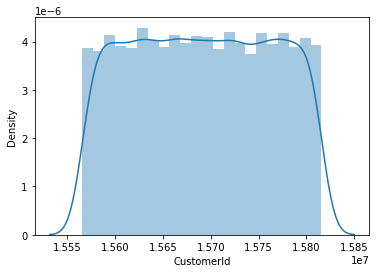

In [14]:

CustomerId = tips['CustomerId']

sns.distplot(CustomerId)

Como se puede ver, la distribución no es uniforme y tiene una cola a la derecha.

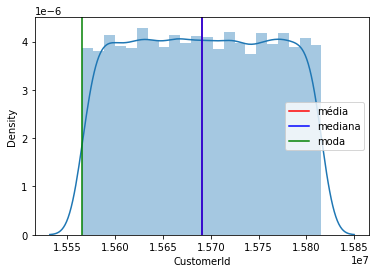

In [15]:
sns.distplot(CustomerId)
mean=CustomerId.mean()
median=CustomerId.median()
mode=CustomerId.mode()

plt.axvline(mean,color='r',label='média')
plt.axvline(median,color='b',label='mediana')
plt.axvline(mode[0],color='g',label='moda')
plt.legend()

Comparemos la estimación de densidad no paramétrica (generada por `distplot`) con una distribución paramétrica, asumiendo una distribución normal. Para ello, usaremos la función que calcula la densidad de probabilidad de la clase `norm`, de la biblioteca` scipy`.

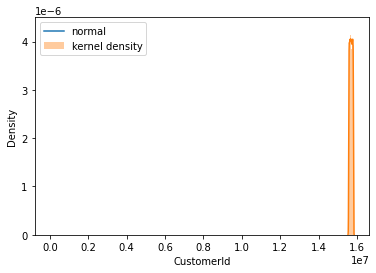

In [16]:
x = np.arange(-5, 60, 0.1) # entire range of x, both in and out of spec

mean = CustomerId.mean() # según el principio de máxima verosimilitud, la media muestral es el mejor estimador de la media
stddev = CustomerId.std()

y = norm.pdf(x, mean, stddev)

plt.plot(x,y,label='normal')
sns.distplot(CustomerId,label='kernel density')
plt.legend()

Otra forma de ver la distribución es crear un `boxplot`.

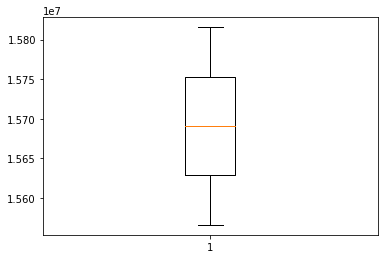

In [17]:
plt.boxplot(CustomerId)
plt.show()

El diagrama de caja está asociado con estadísticas descriptivas:

In [18]:
Q1 = CustomerId.quantile(q=0.25)
Q2 = CustomerId.quantile(q=0.5)
Q3 = CustomerId.quantile(q=0.75)
IQR = Q3 - Q1
LI = max(Q1 - 1.5 * IQR, CustomerId.min()) 
LU = min(Q3 + 1.5 * IQR, CustomerId.max())

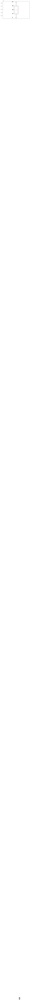

In [21]:
plt.boxplot(CustomerId)
plt.text(0.85,Q1,s='Q1',size=13)
plt.text(0.85,Q2,s='Q2',size=13)
plt.text(0.85,Q3,s='Q3',size=13)
plt.text(0.85,LI,s='LI',size=13)
plt.text(0.85,LU,s='LU',size=13)
plt.text(1.1,16,s='IQR',rotation=90,size=20)
plt.show()

## Herramientas para agilizar el proceso

Calcular estadísticas manualmente invocando funciones y creando gráficos puede resultar bastante engorroso. Varias herramientas son capaces de generar informes estandarizados para análisis de datos exploratorios. Uno de ellos es `sweetviz`. 

                                             |          | [  0%]   00:00 -> (? left)


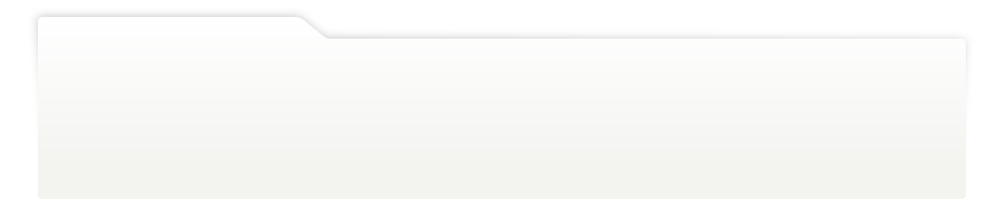
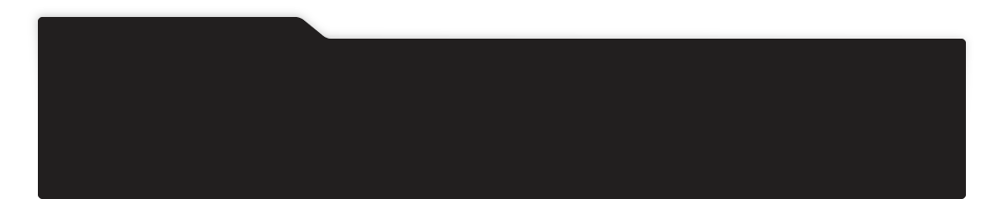
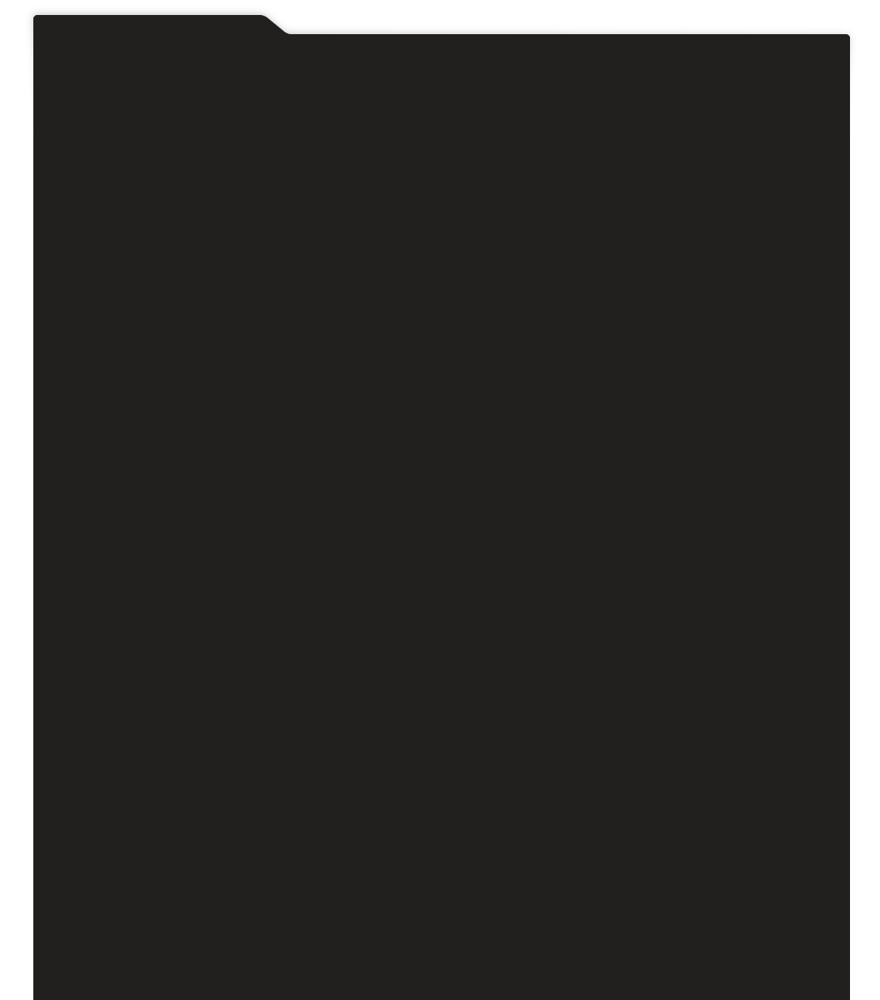
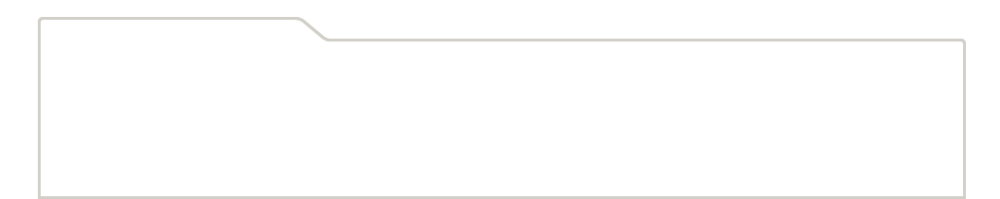
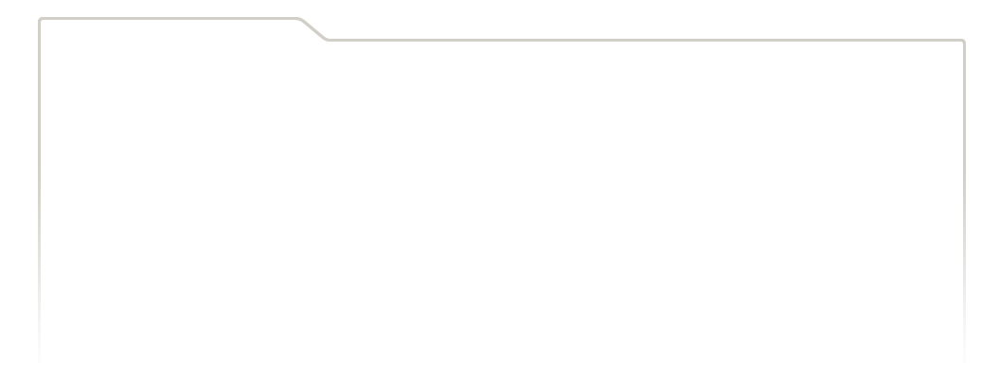
...
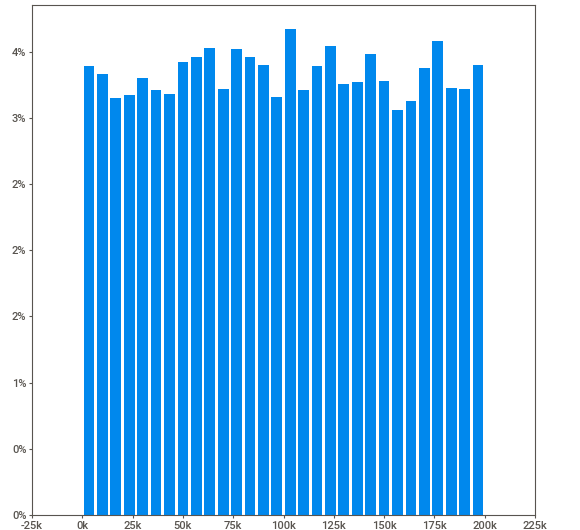
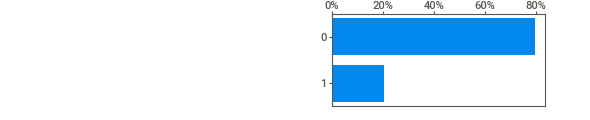
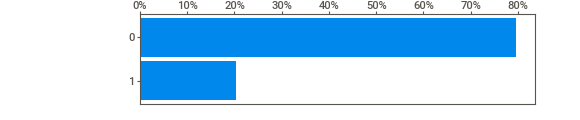
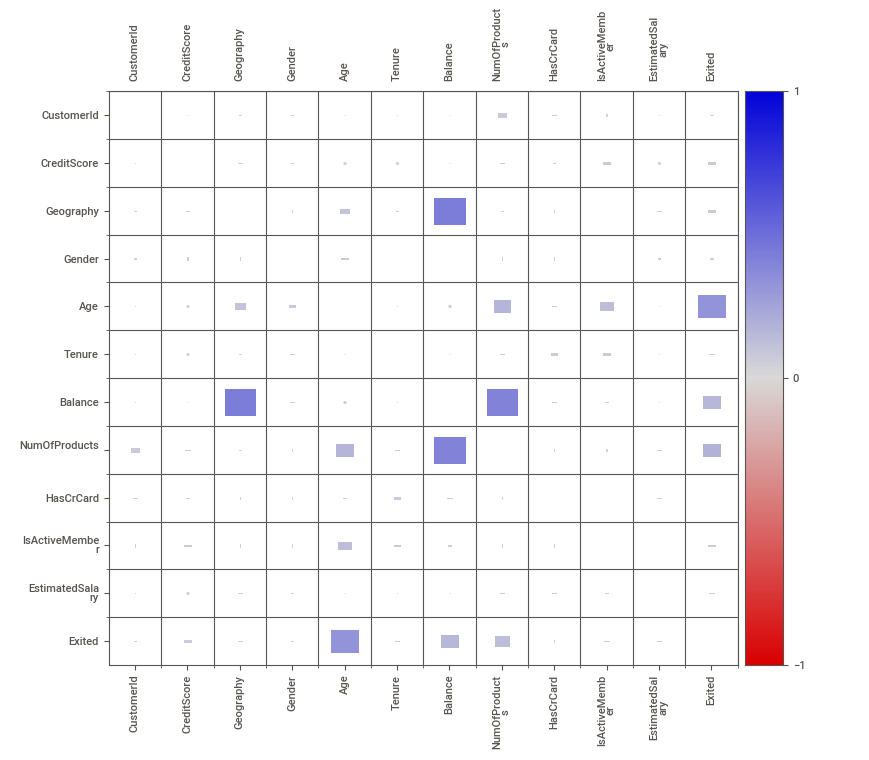
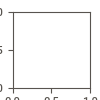

In [20]:
report = sv.analyze(tips)
report.show_notebook()

Es posible comparar diferentes cortes de base. Por ejemplo, compare el subconjunto de Geografia francesa y española

                                             |          | [  0%]   00:00 -> (? left)


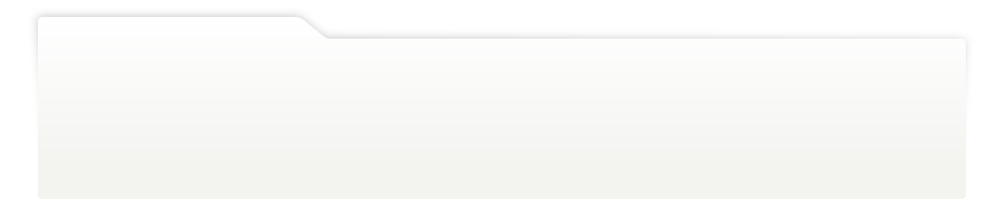
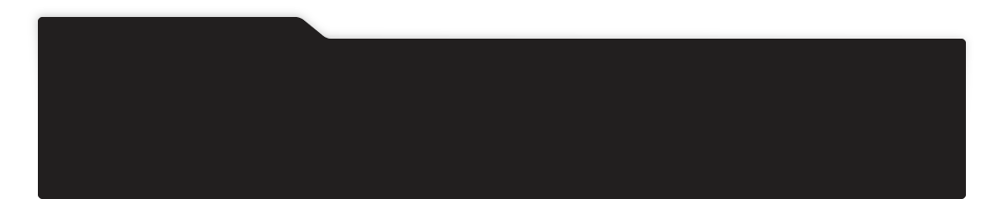
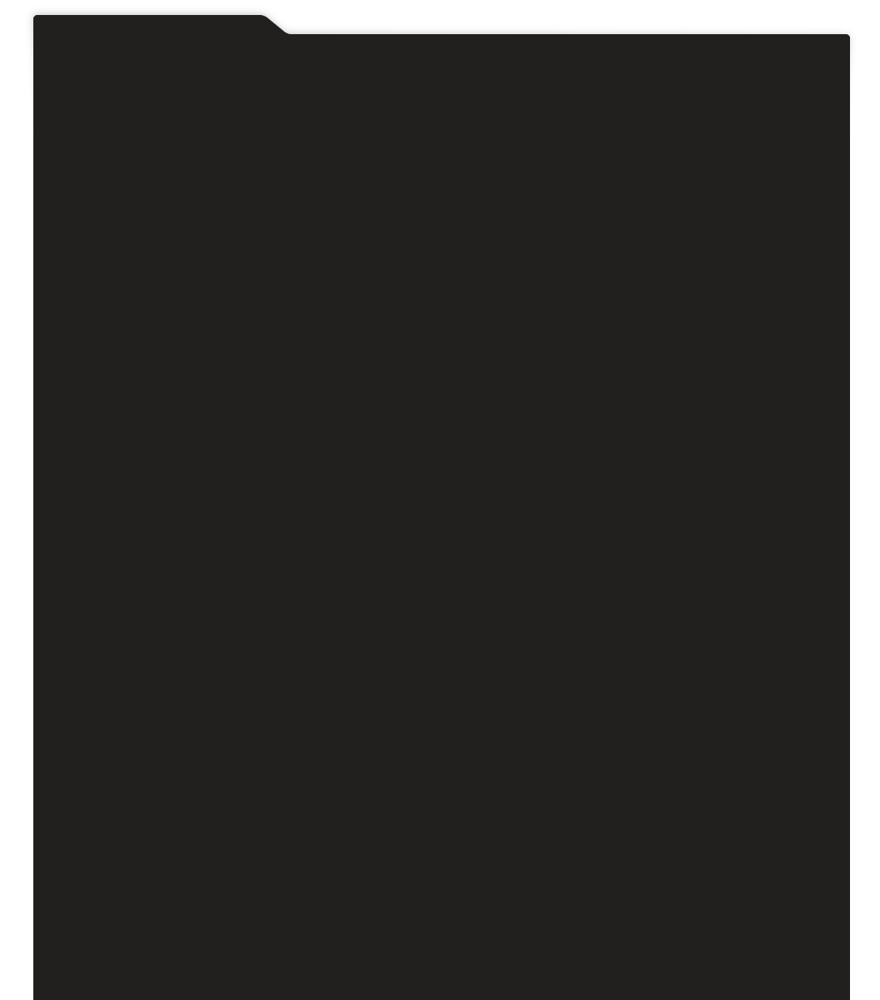
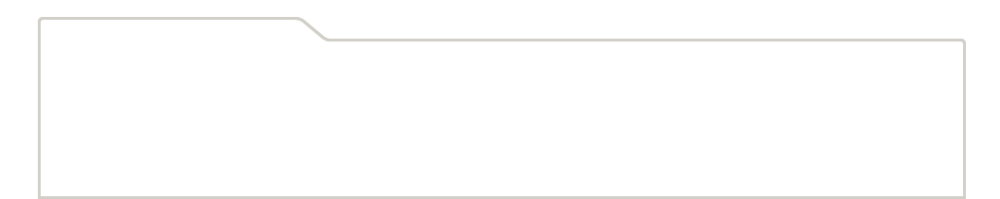
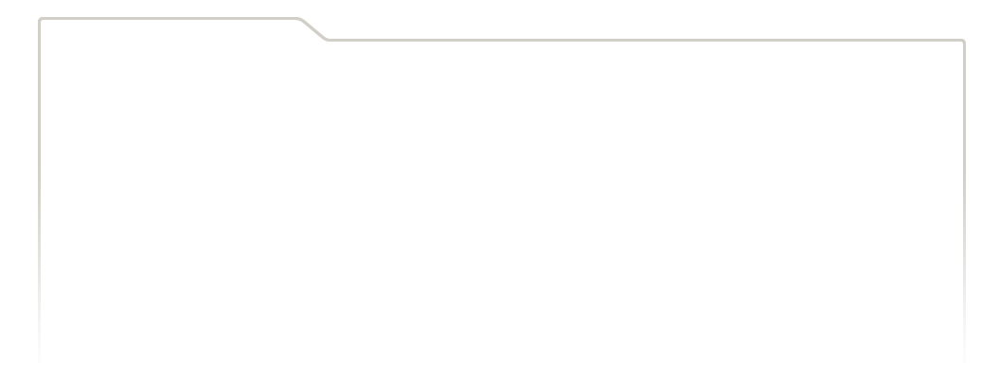
...
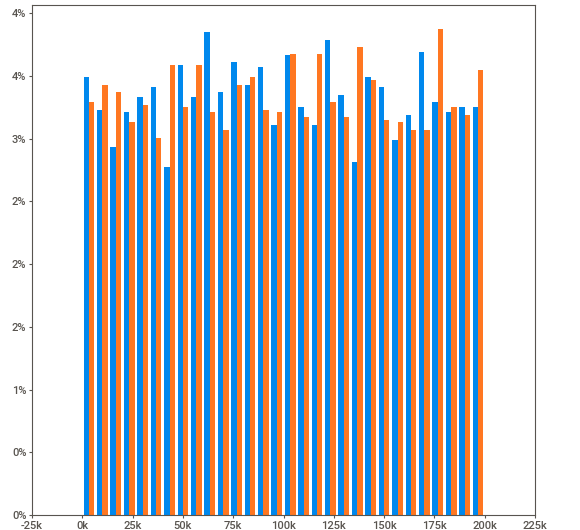
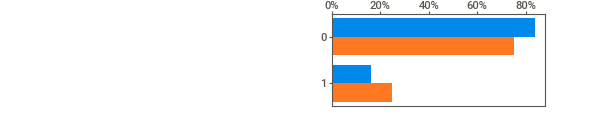
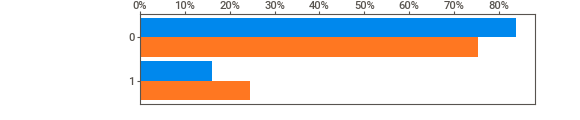
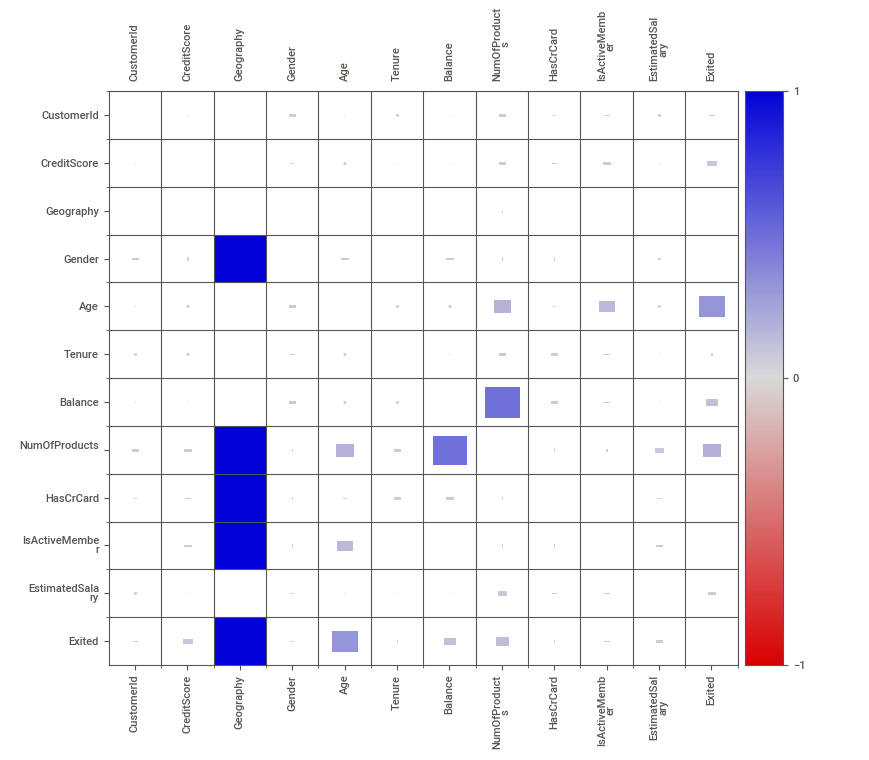
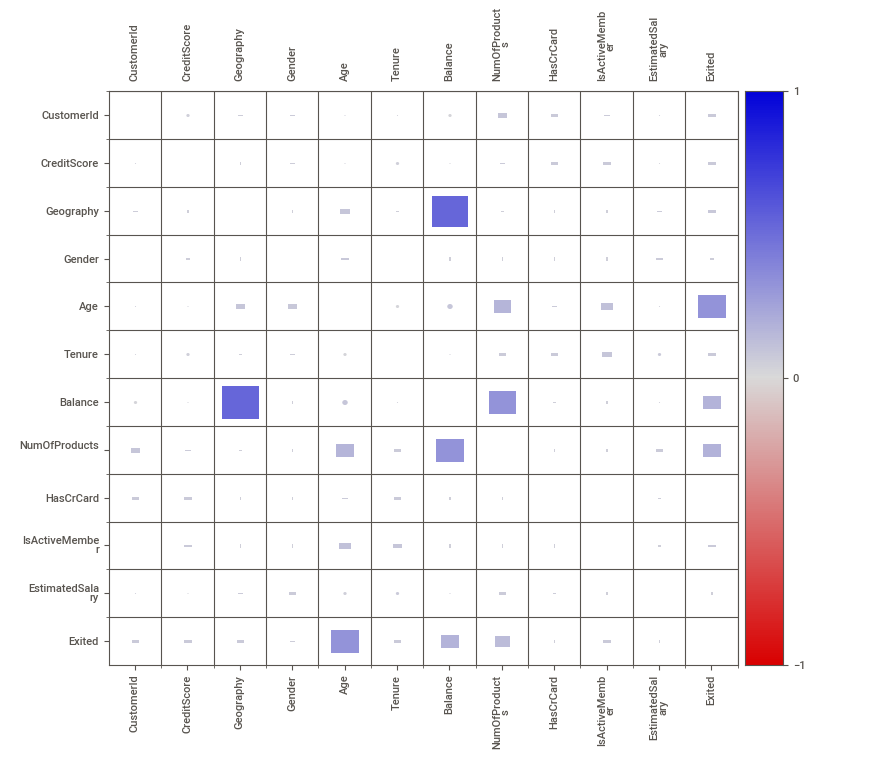

In [27]:
report = sv.compare_intra(tips,tips["Geography"] == "France",["Geography","Spain Geography"])
report.show_notebook() 

O el subconjunto de clientes masculinos y femeninos:

                                             |          | [  0%]   00:00 -> (? left)


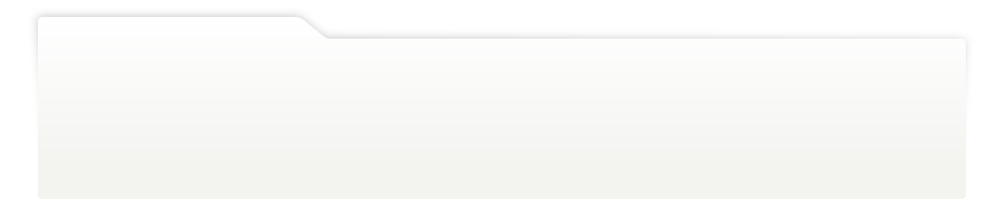
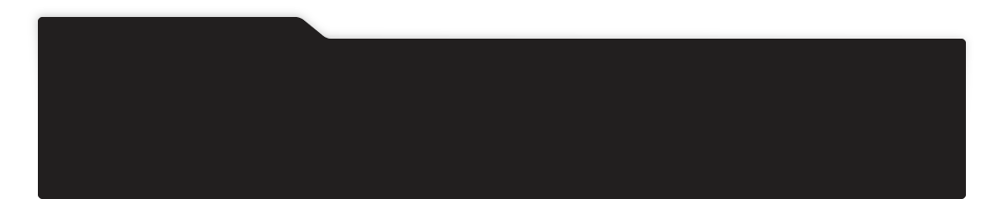
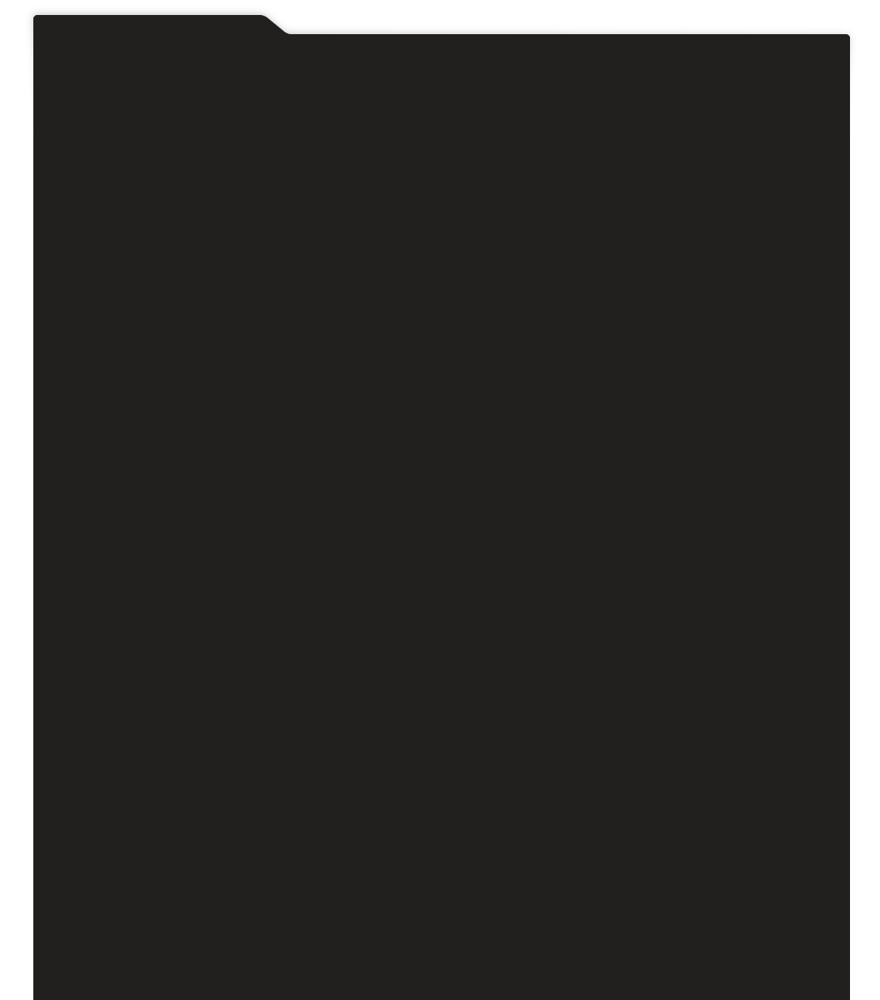
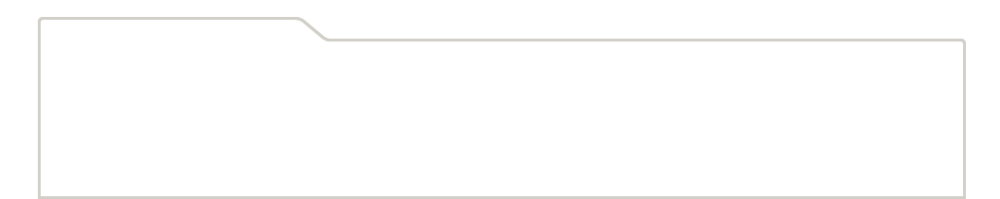
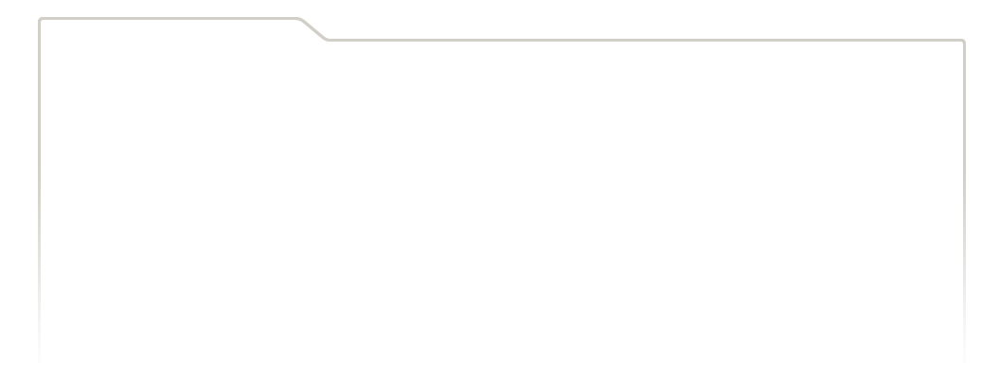
...
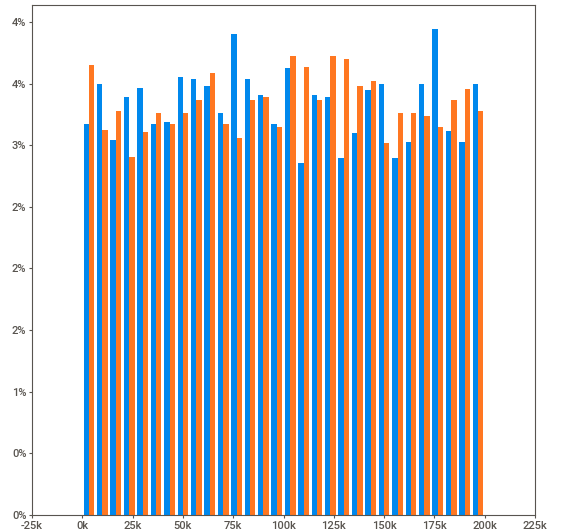
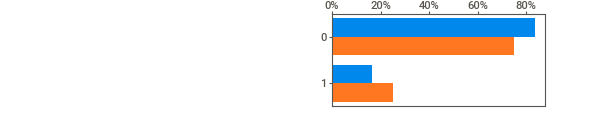
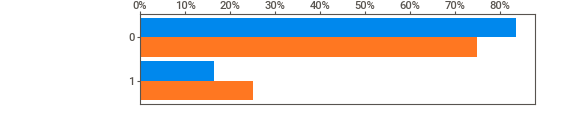
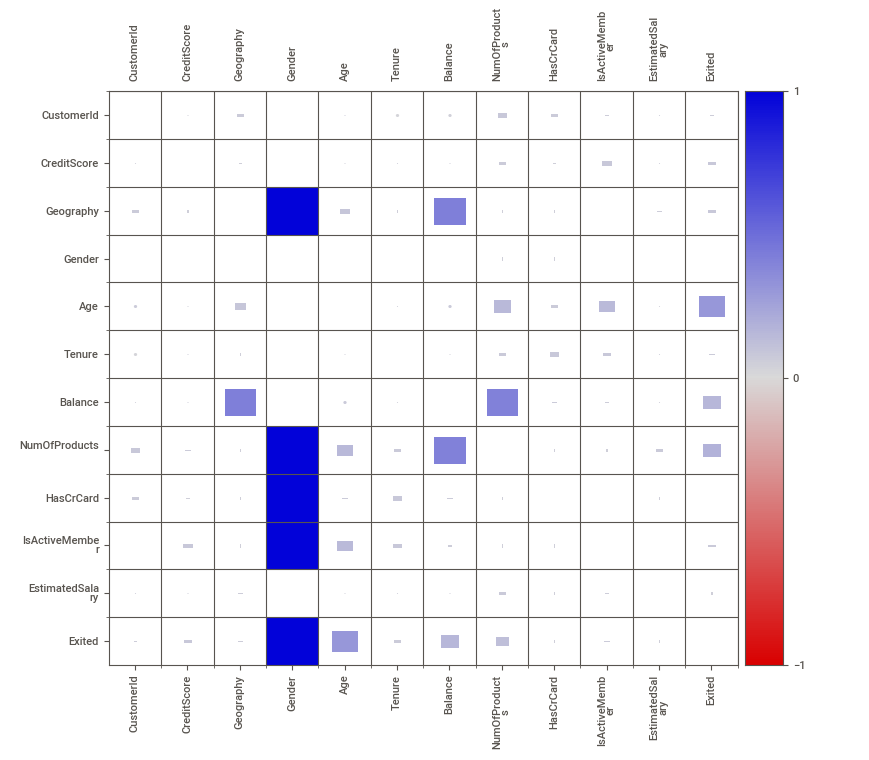
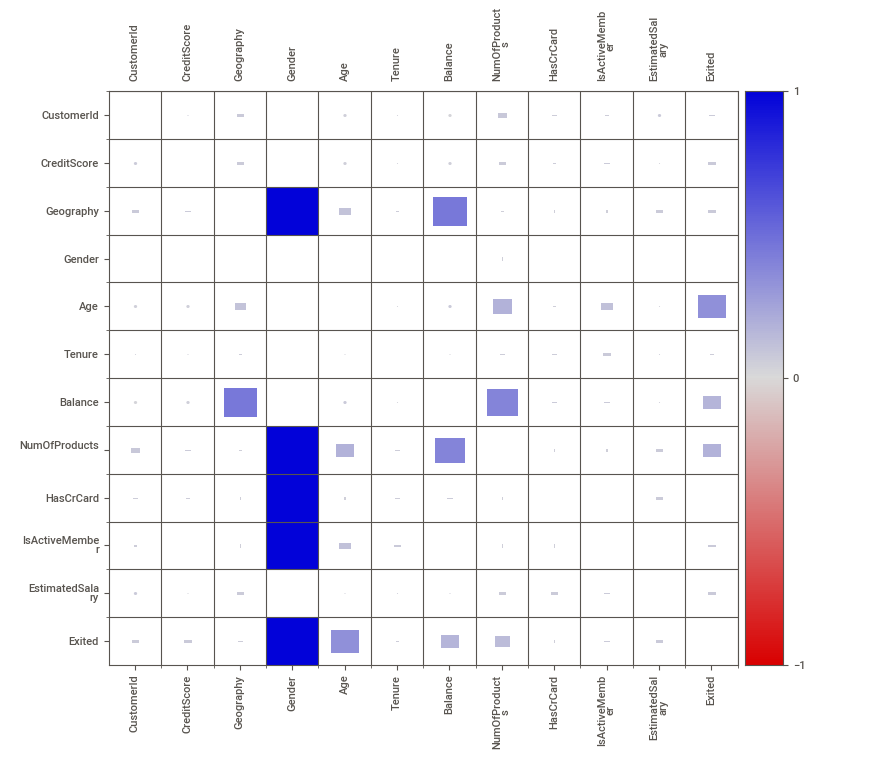

In [29]:
report = sv.compare_intra(tips,tips["Gender"] == "Male",["Male","Female"])
report.show_notebook()

O los subgrupos de surname :

                                             |          | [  0%]   00:00 -> (? left)


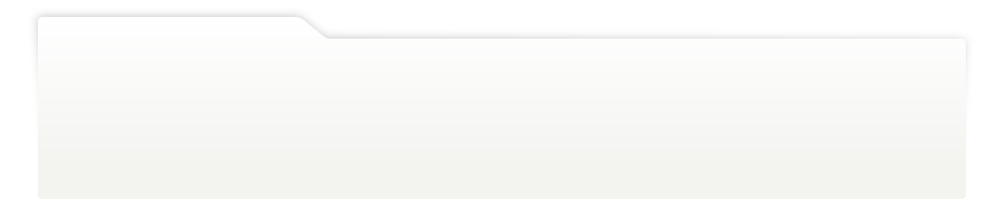
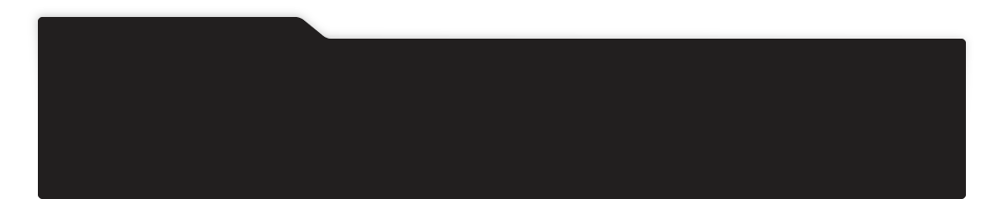
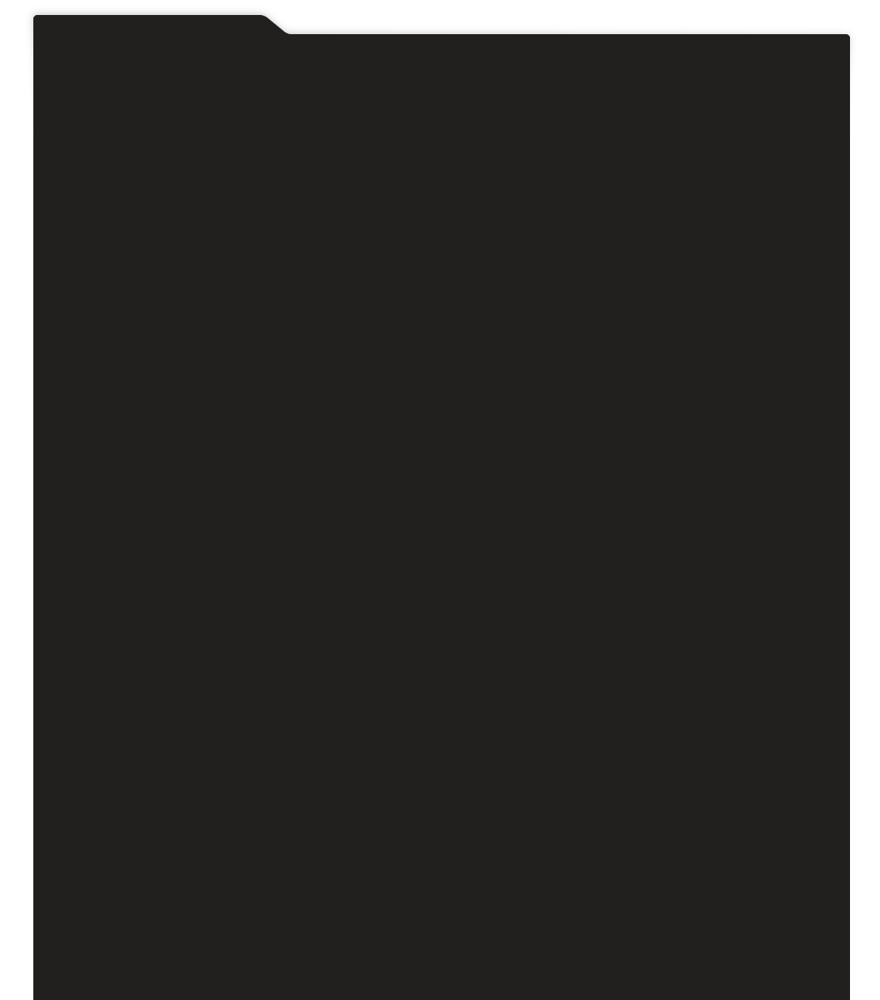
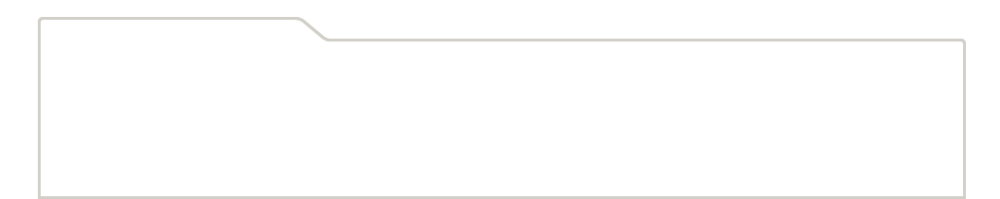
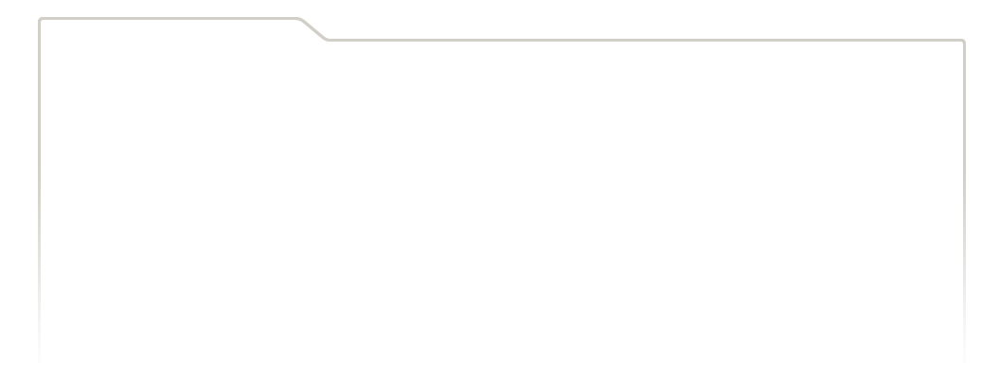
...
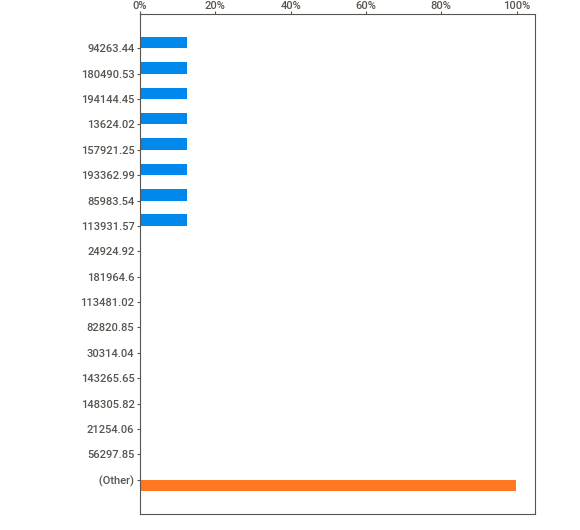
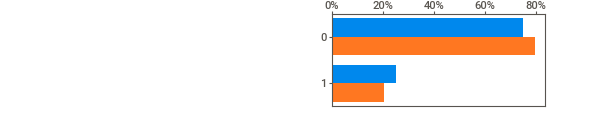
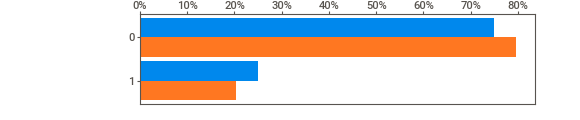
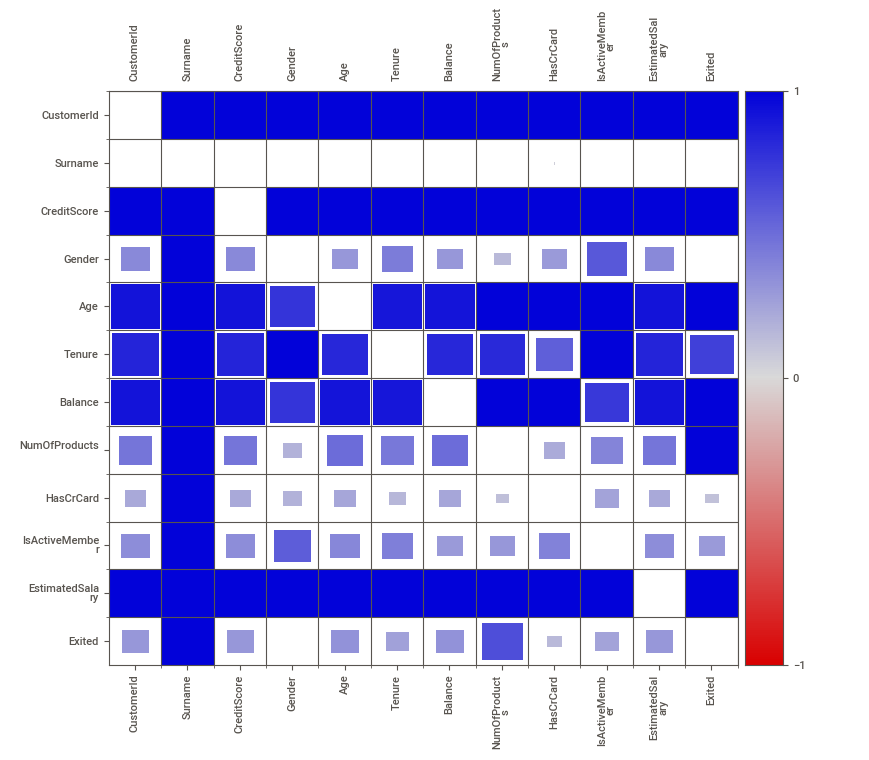
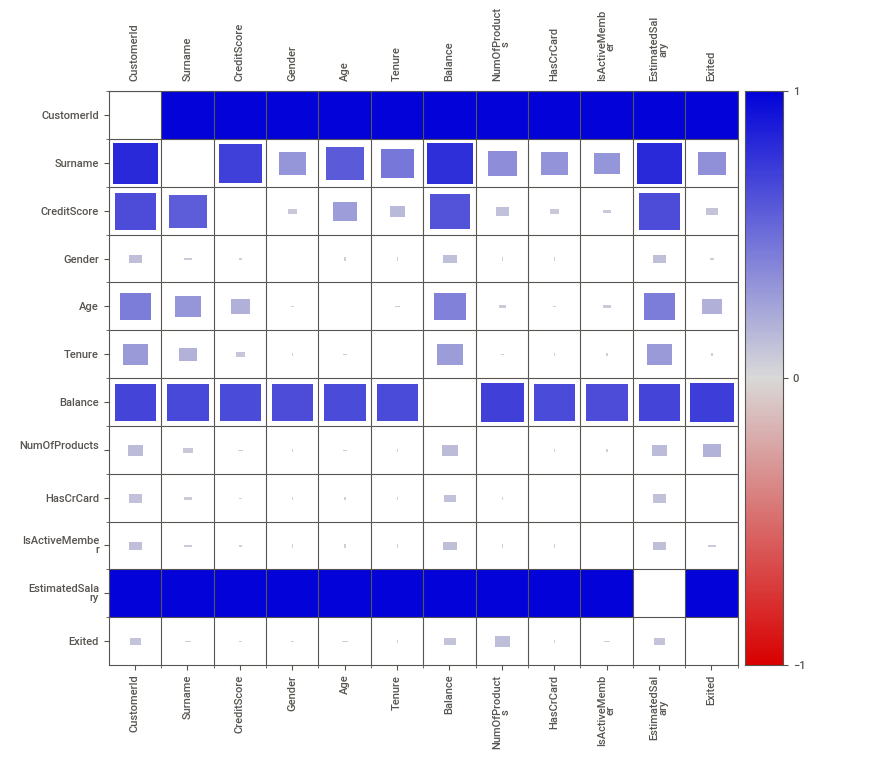

In [34]:


report = sv.compare_intra(tips,tips["Surname"] == "Onio",["Onio","Chu"])
report.show_notebook()

## Impacto de los valores perdidos

Para ilustrar la diferencia entre los mecanismos de valor perdido, simulemos diferentes mecanismos de valor perdido y comparemos bases de datos. Inicialmente haremos una copia de la base de datos:

In [35]:
tips_NA = tips.copy()

Y luego seleccionamos una muestra aleatoria del 20%,

In [36]:
sample = np.random.choice(list(tips_NA.index),int(len(tips)*0.2))
tips_NA.loc[sample,['CustomerId','tip']] = np.nan

Comparemos los dos conjuntos de datos:

                                             |          | [  0%]   00:00 -> (? left)


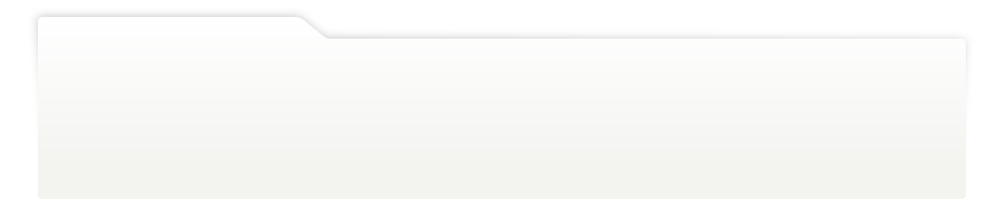
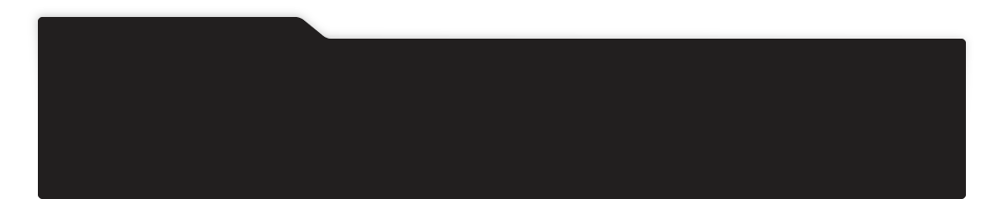
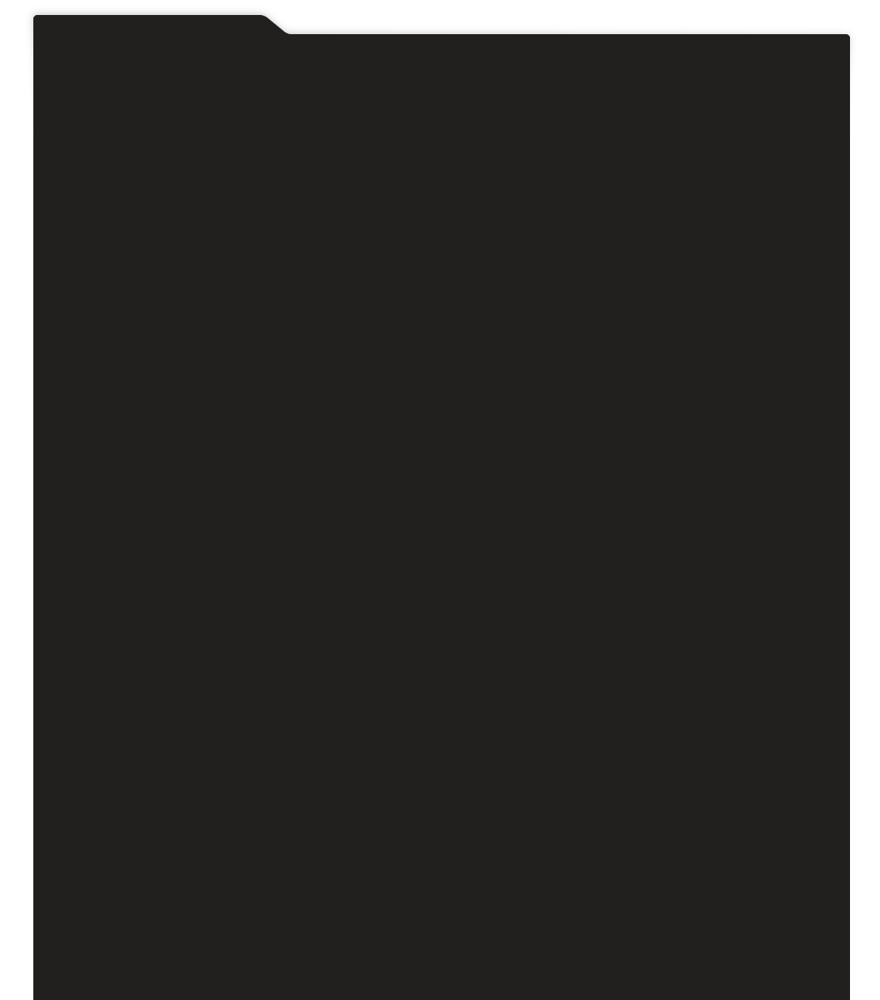
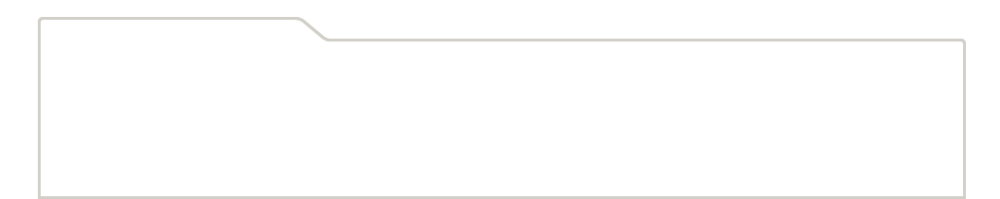
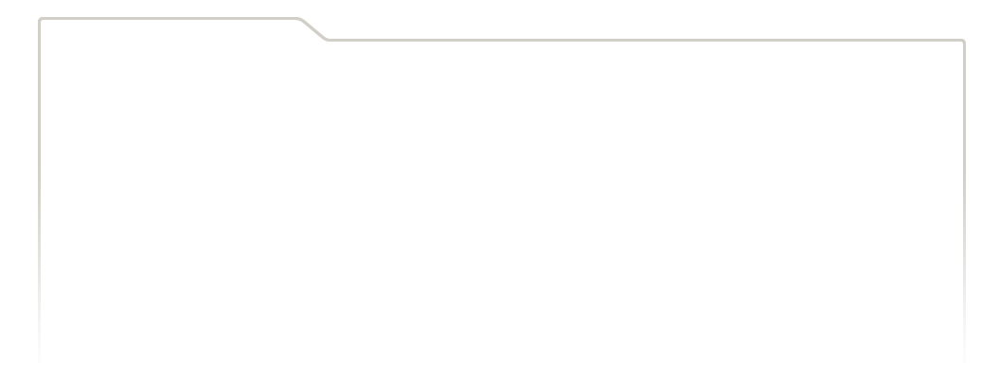
...
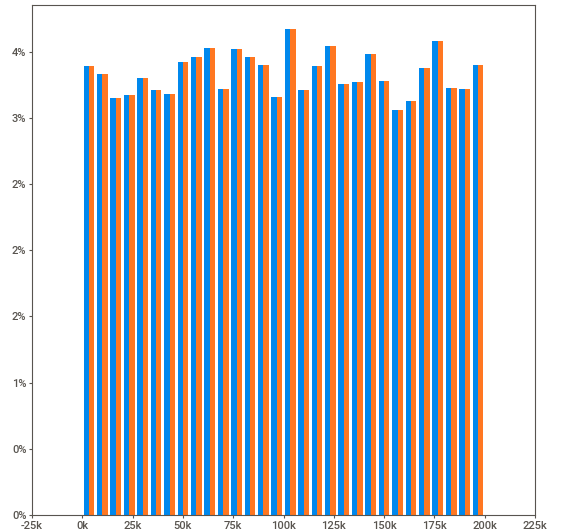
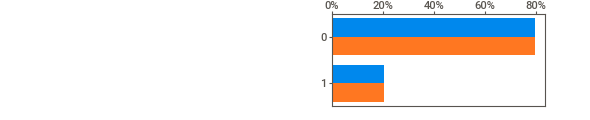
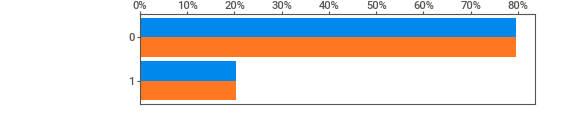
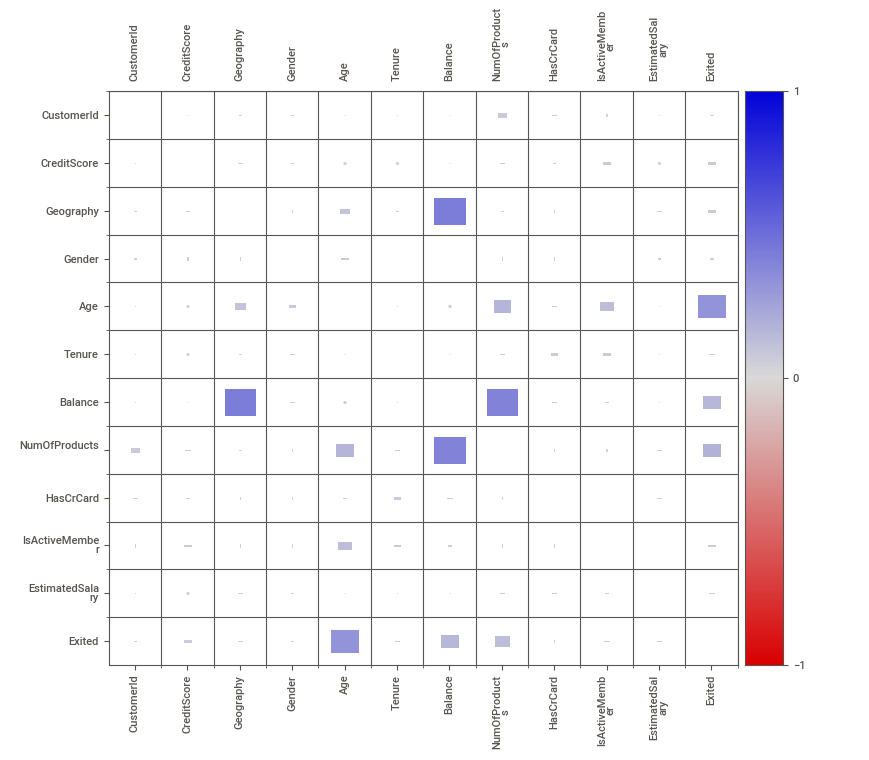
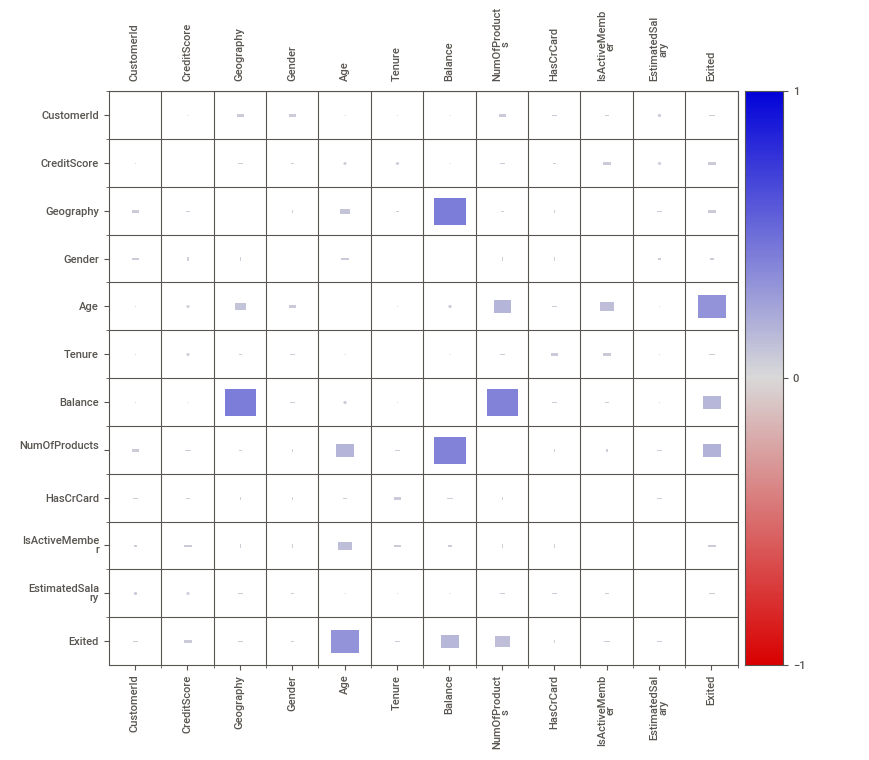

In [37]:
report = sv.compare([tips,"Original"],[tips_NA,"Ausentes"])
report.show_notebook()

Una de las técnicas utilizadas para lidar con datos faltantes es eliminar las filas que contienen un valor faltante, utilizando la función `.dropna ()`.

Otra de las técnicas utilizadas para lidar con datos faltantes es inputar las filas que contienen un valor perdido, utilizando la función `.fillna()`.

                                             |          | [  0%]   00:00 -> (? left)


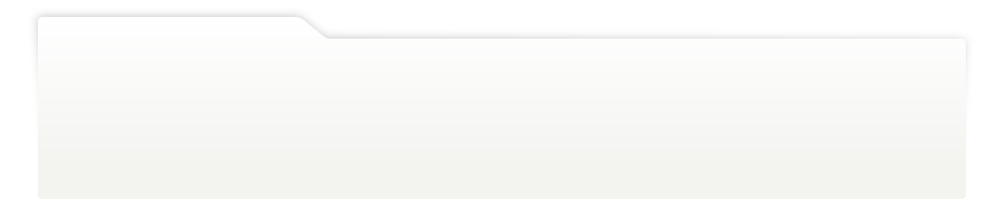
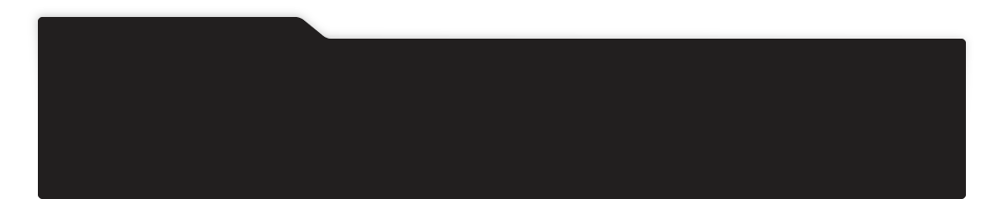
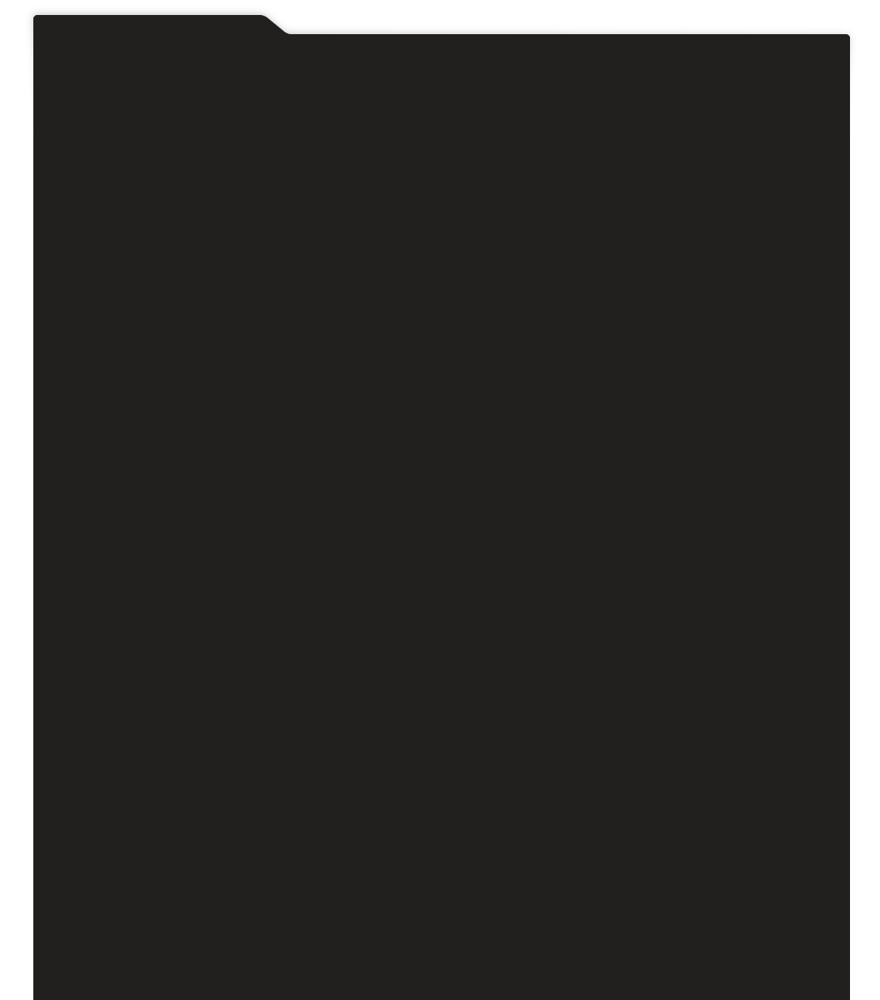
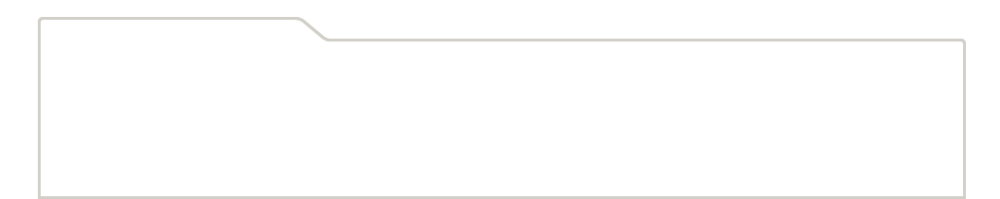
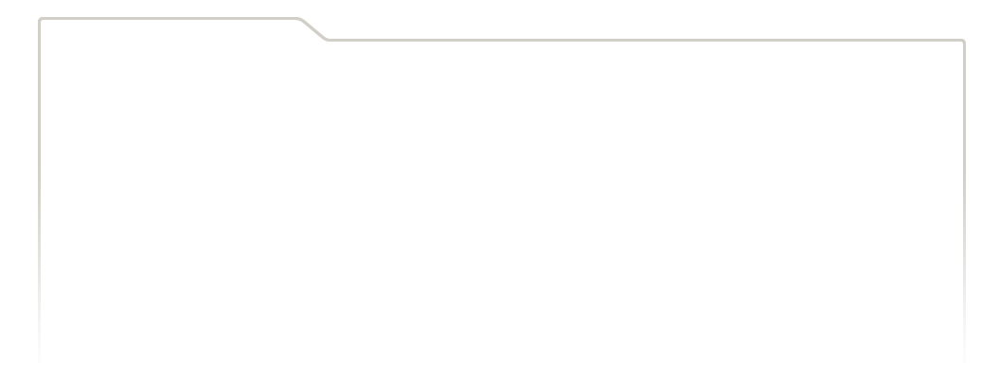
...
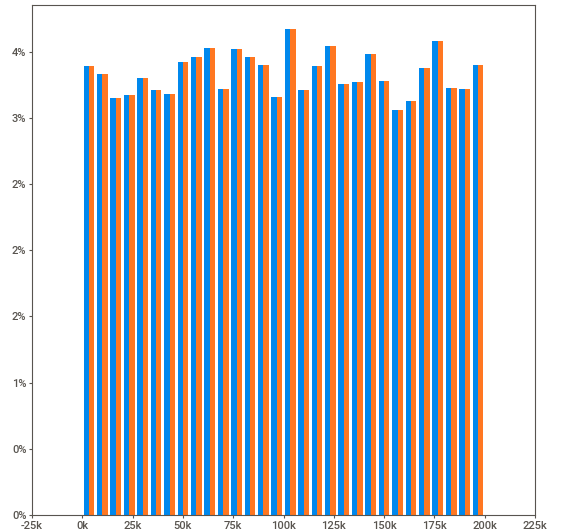
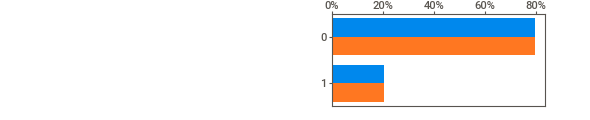
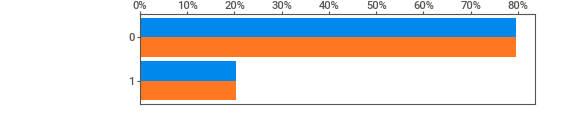
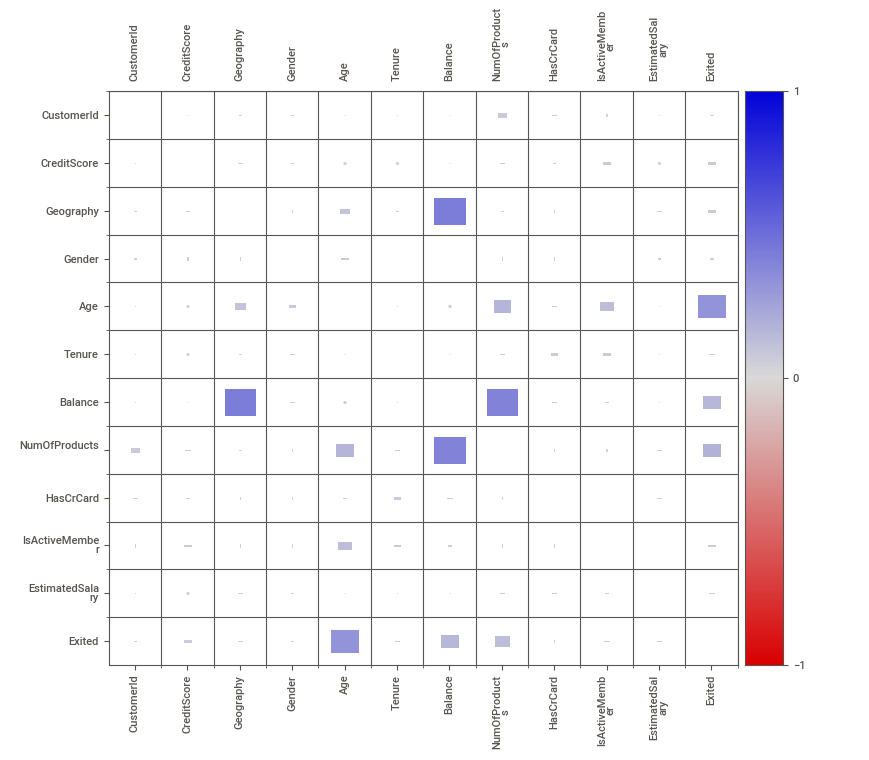
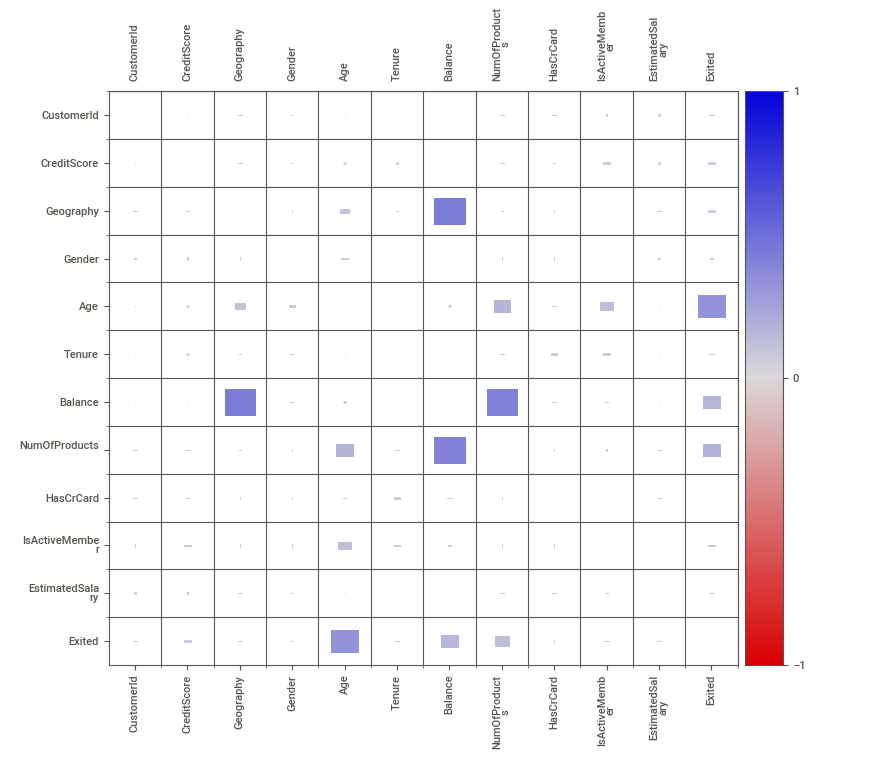

In [40]:
tips_input = tips_NA.fillna(tips_NA.median())
report = sv.compare([tips,"Original"],[tips_input,"Inputado"])
report.show_notebook() 

Datos faltantes con prioridad 

In [42]:
#crear una columnas de probabilidades, al inicio todos con probabilidad 1
p = np.ones(len(tips['Geography']))
# escojer la probabilidad de 0.5 
p[np.where(tips['Geography']=='France')] = 0.5
#calcular la probabilidad par cada item del dat set
p = p/sum(p)



In [43]:
p

array([6.67289470e-05, 1.33457894e-04, 6.67289470e-05, ...,
       6.67289470e-05, 1.33457894e-04, 6.67289470e-05])

In [44]:
tips_NA2 = tips.copy()
sample = np.random.choice(list(tips_NA2.index),int(len(tips)*0.2), p = p)
tips_NA2.loc[sample,['CustomerId','tip']] = np.nan

                                             |          | [  0%]   00:00 -> (? left)


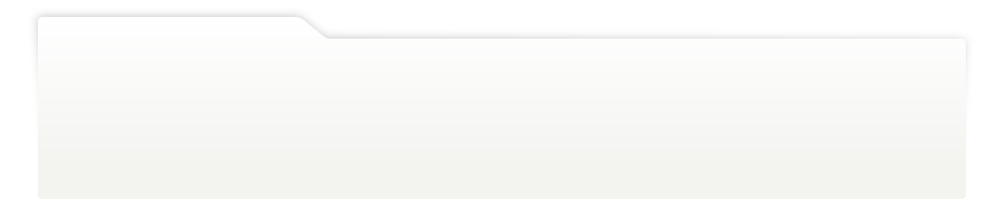
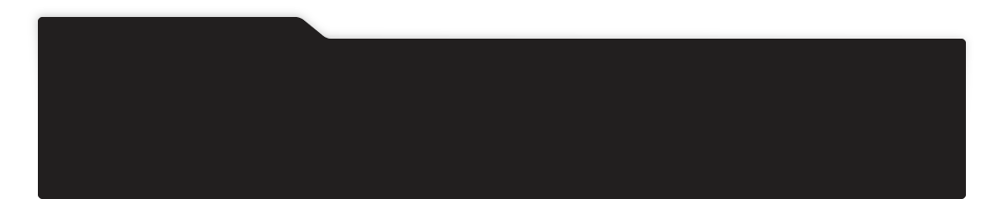
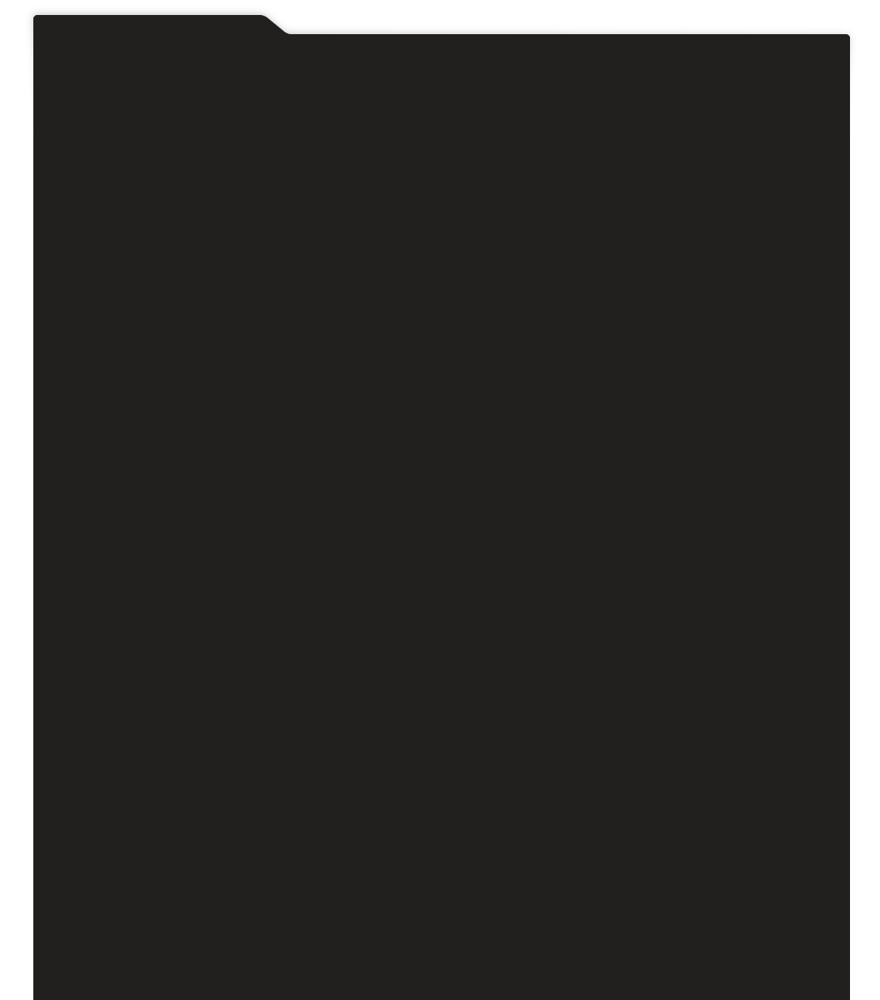
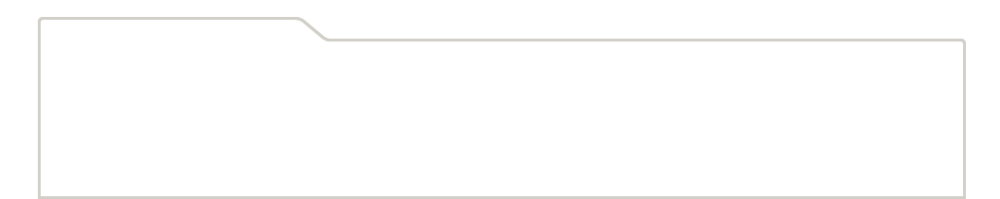
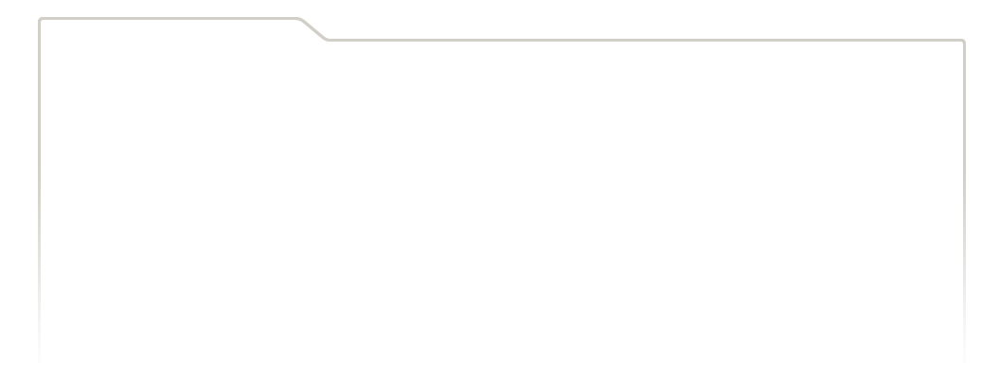
...
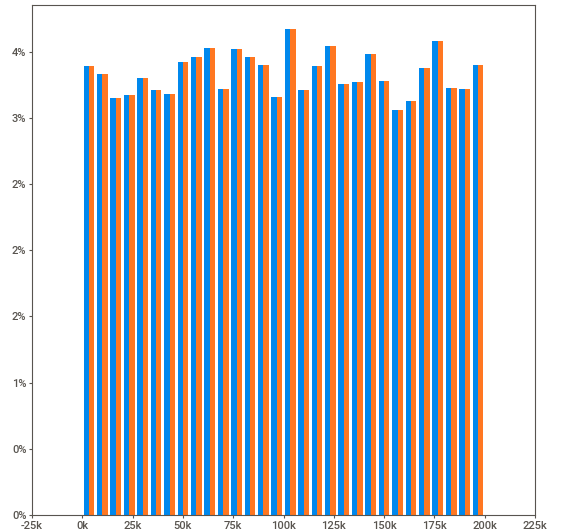
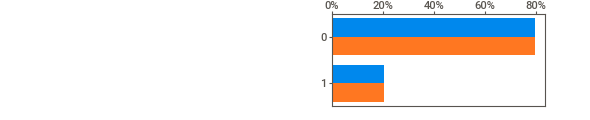
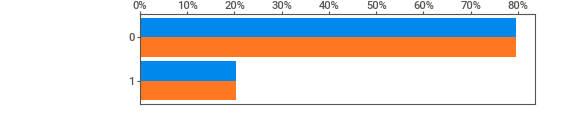
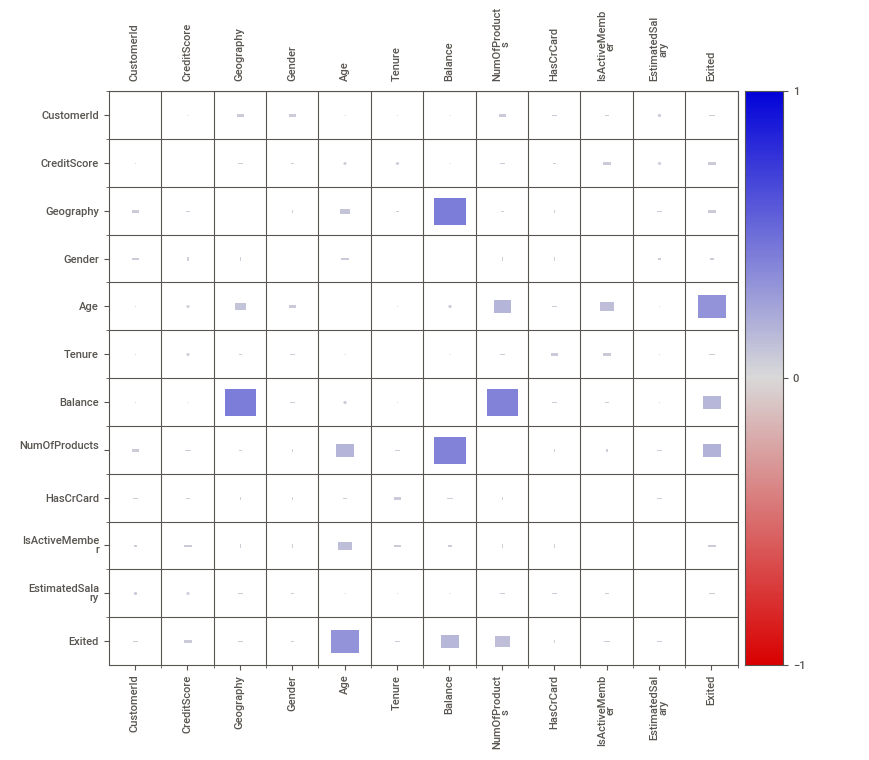
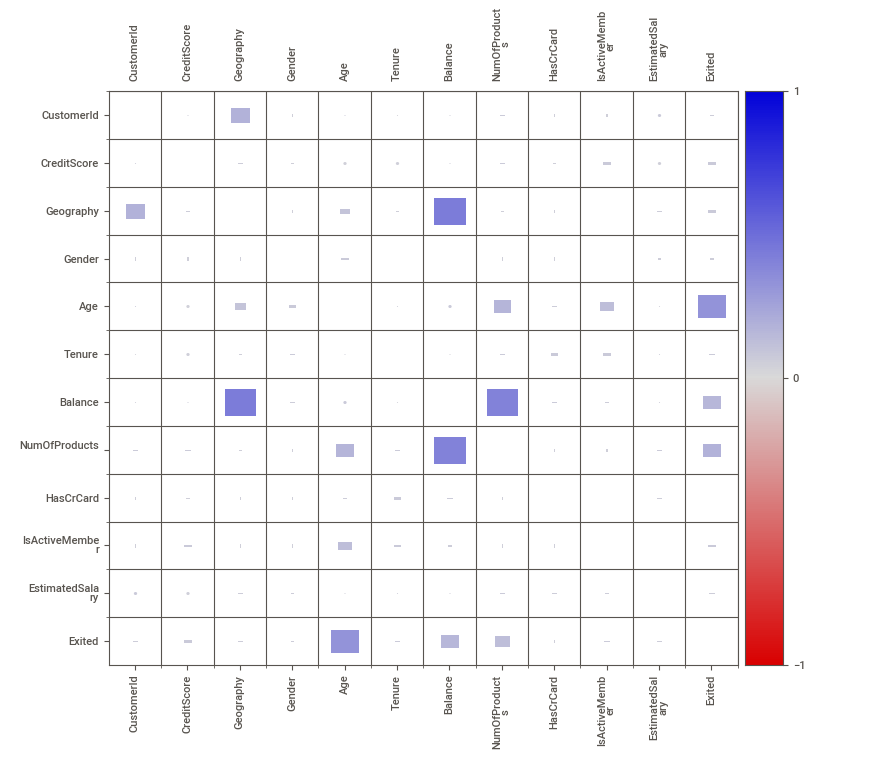

In [45]:
report = sv.compare([tips_NA,"MCAR"],[tips_NA2,"MAR"])
report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)


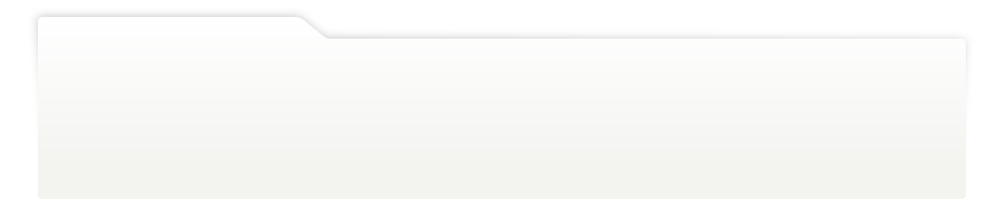
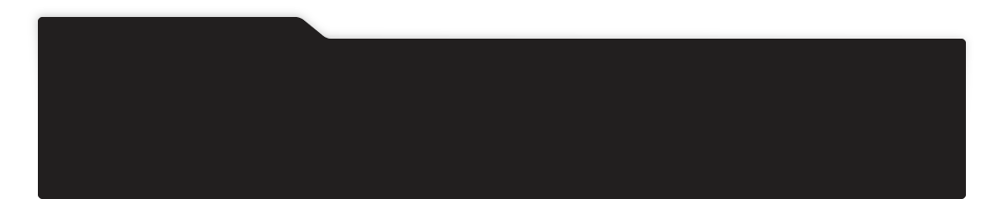
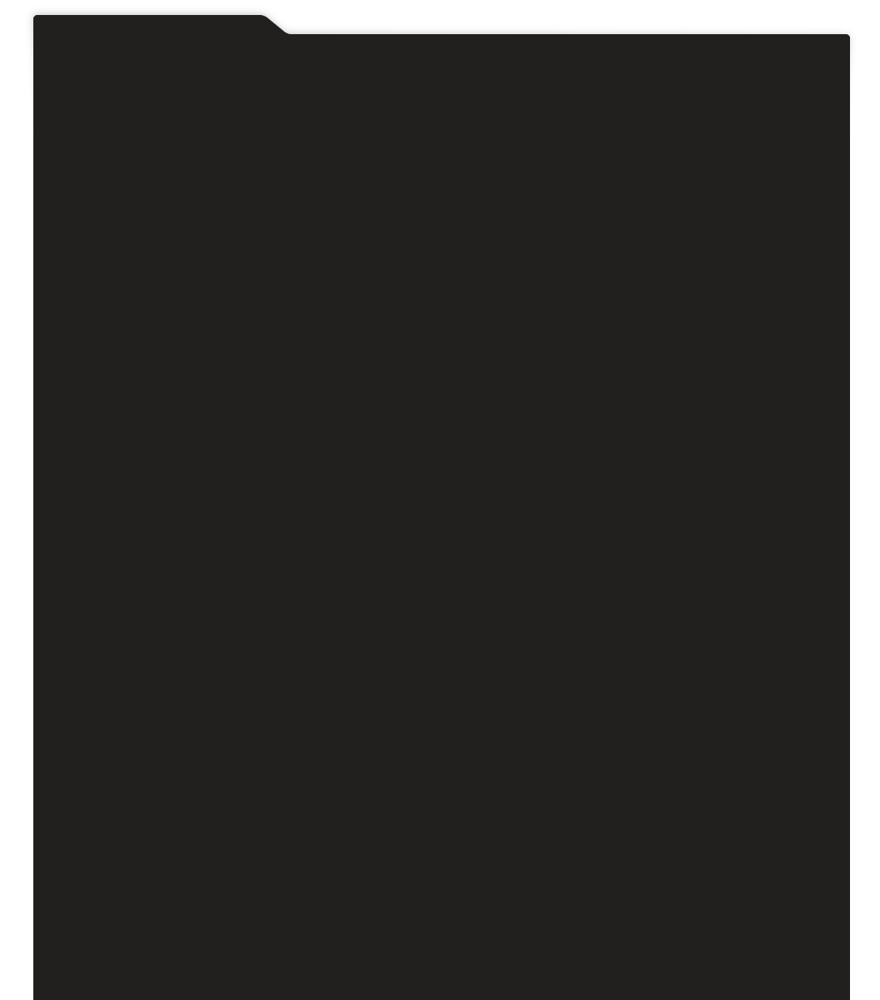
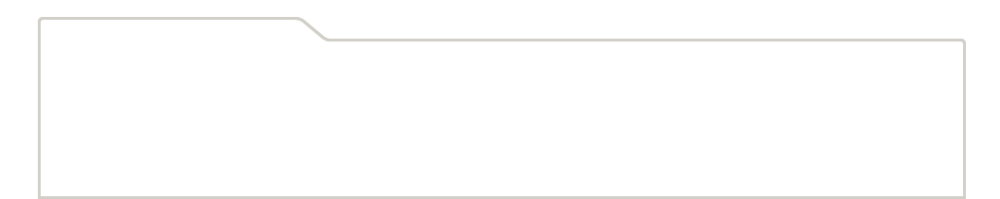
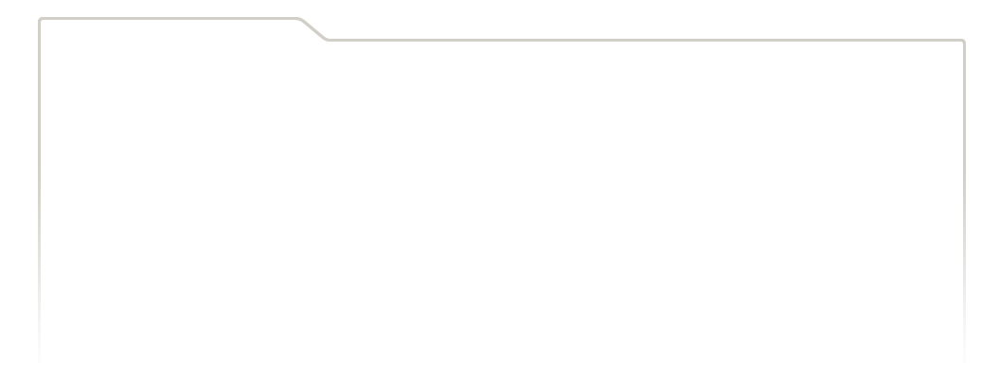
...
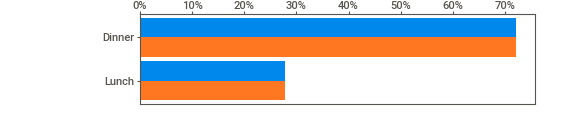
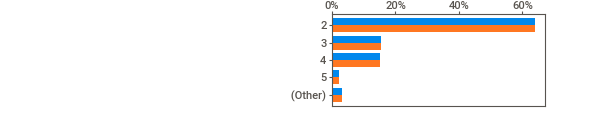
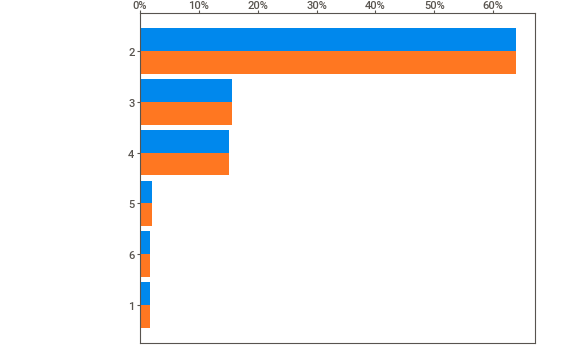
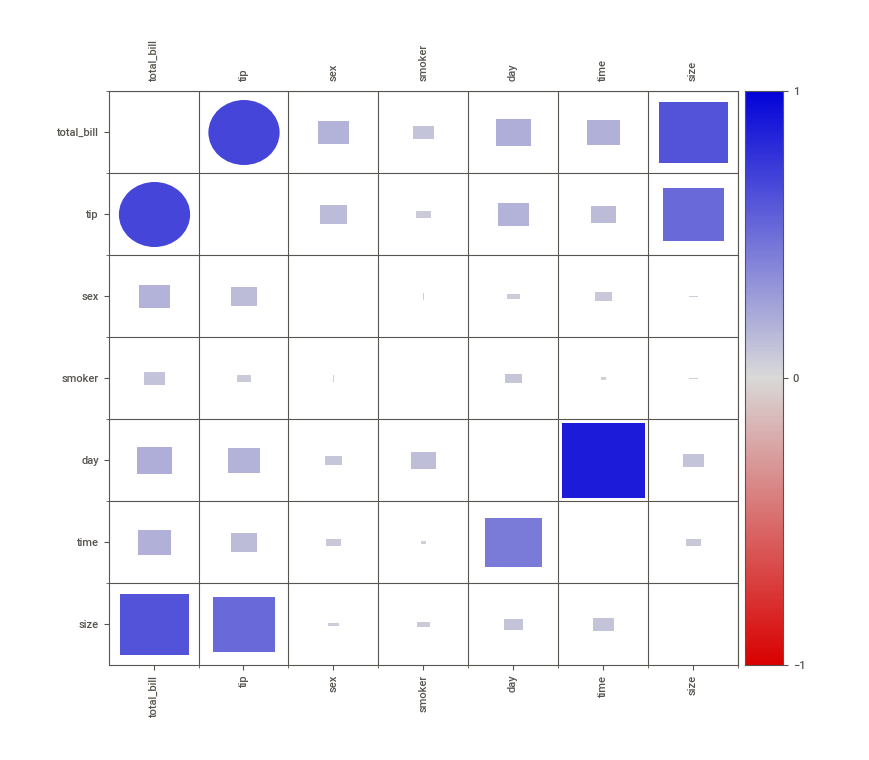
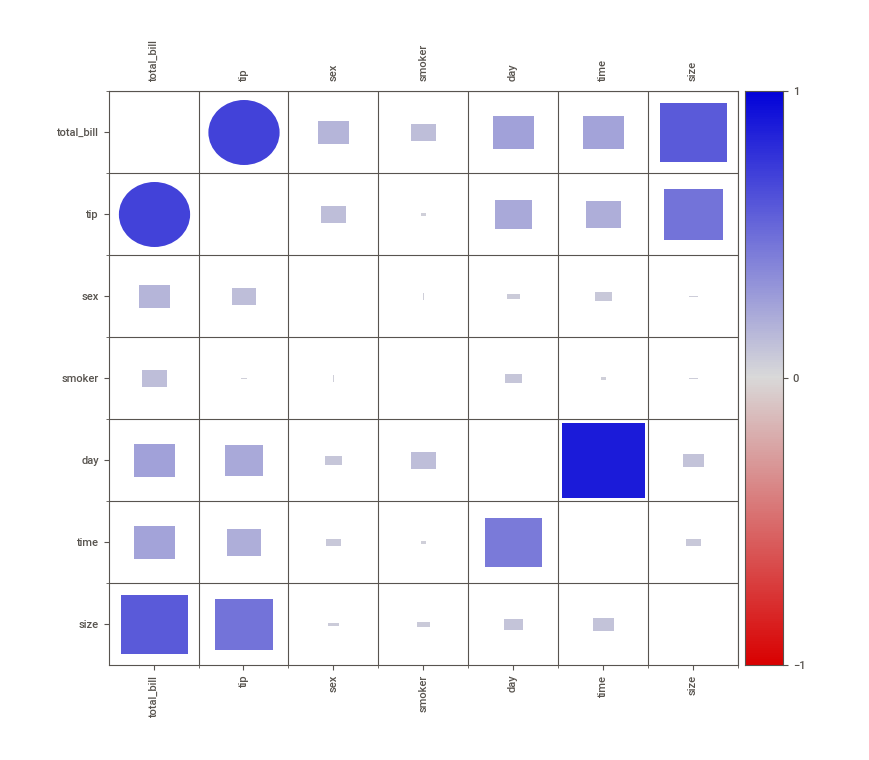

In [ ]:
tips_input2 = tips_NA2.fillna(tips_NA2.mean())
report = sv.compare([tips_input,"MCAR"],[tips_input2,"MAR"])
report.show_notebook() 

In [ ]:
tips_removido2 = tips_NA2.dropna()
report = sv.compare([tips_removido,"MCAR"],[tips_removido2,"MAR"])
report.show_notebook() 

In [50]:
p = tips['CreditScore']/tips['CreditScore'].sum()
tips_NA3 = tips.copy()
sample = np.random.choice(list(tips_NA3.index),int(len(tips)*0.2), p = p)
tips_NA3.loc[sample,['CustomerId','CreditScore']] = np.nan

In [ ]:
#tips['tip']/tips['tip'].sum()

                                             |          | [  0%]   00:00 -> (? left)


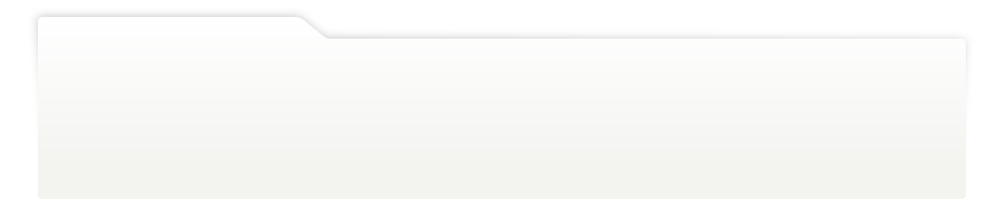
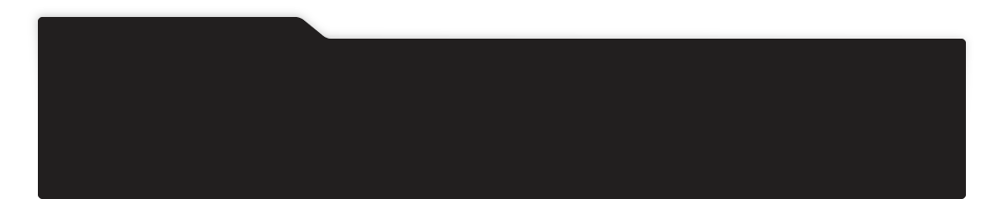
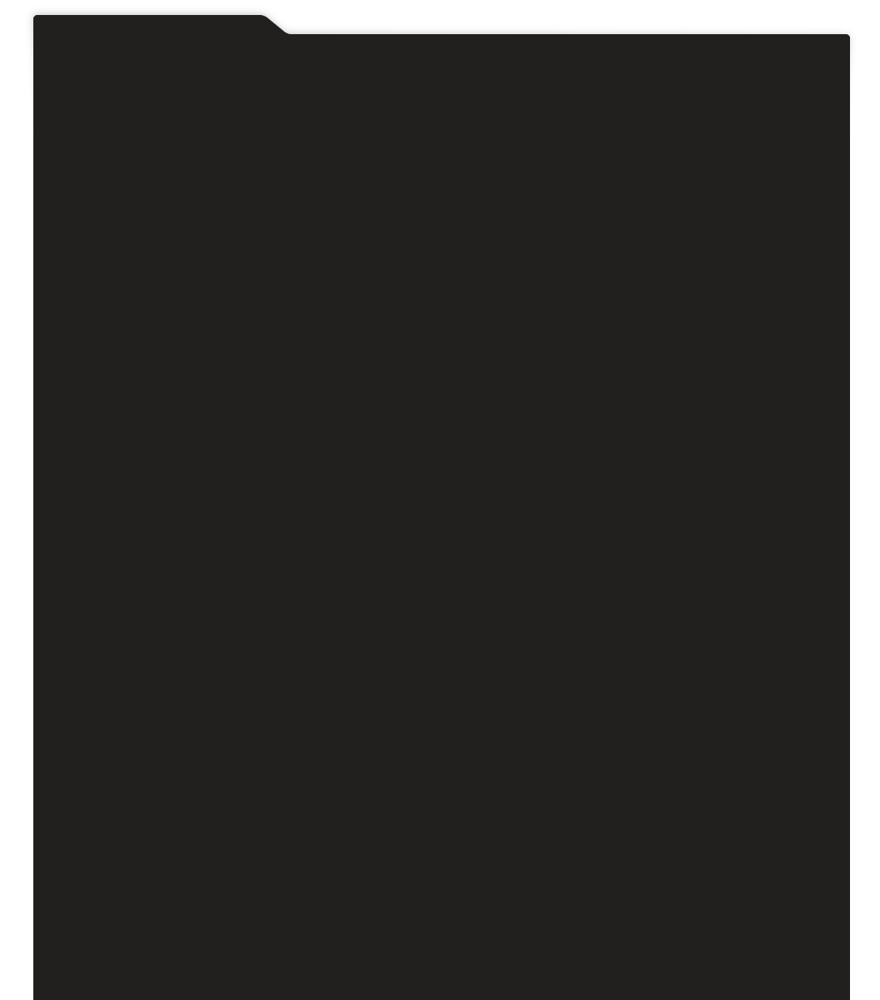
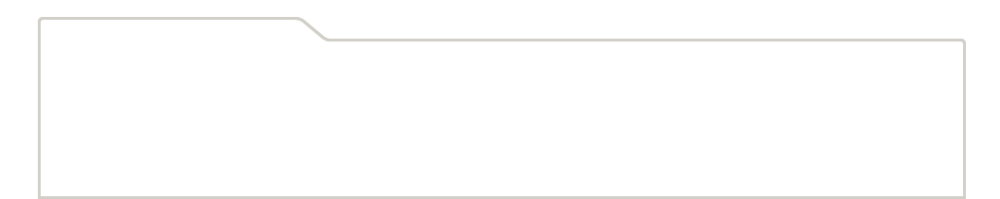
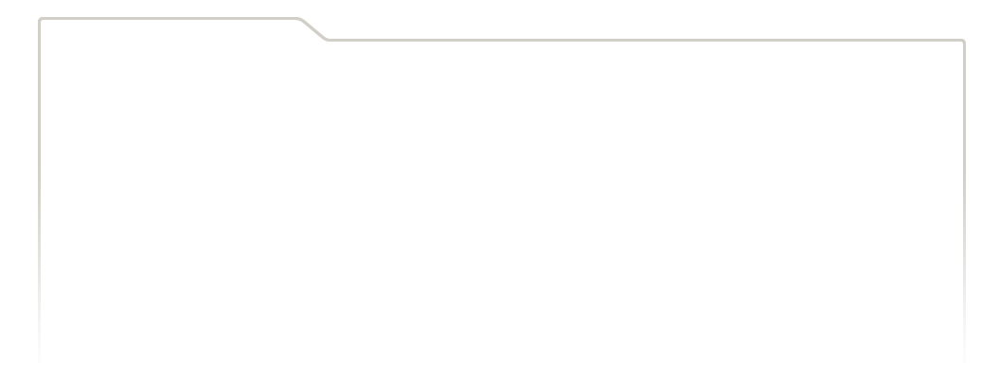
...
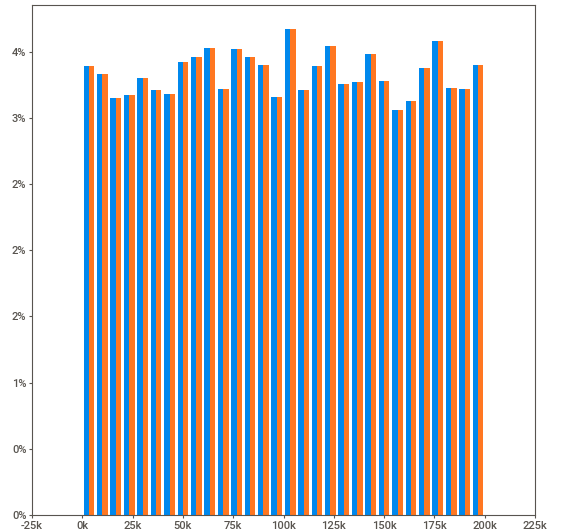
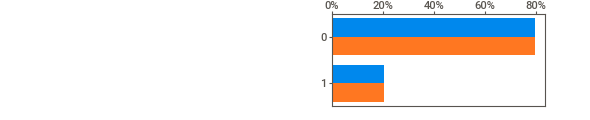
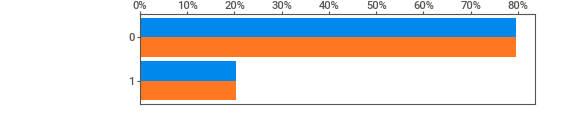
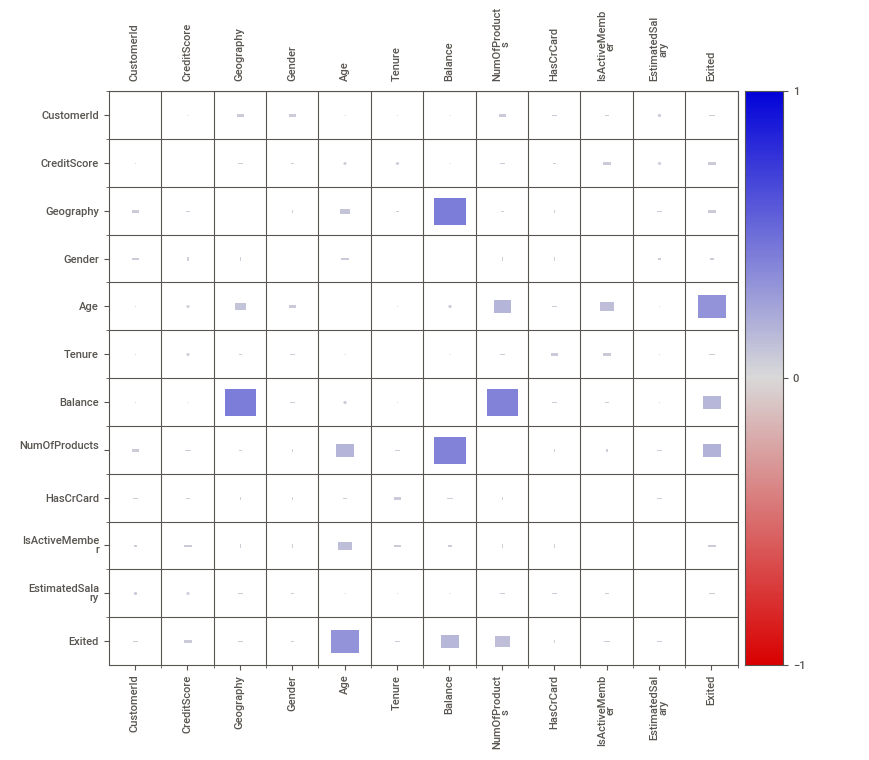
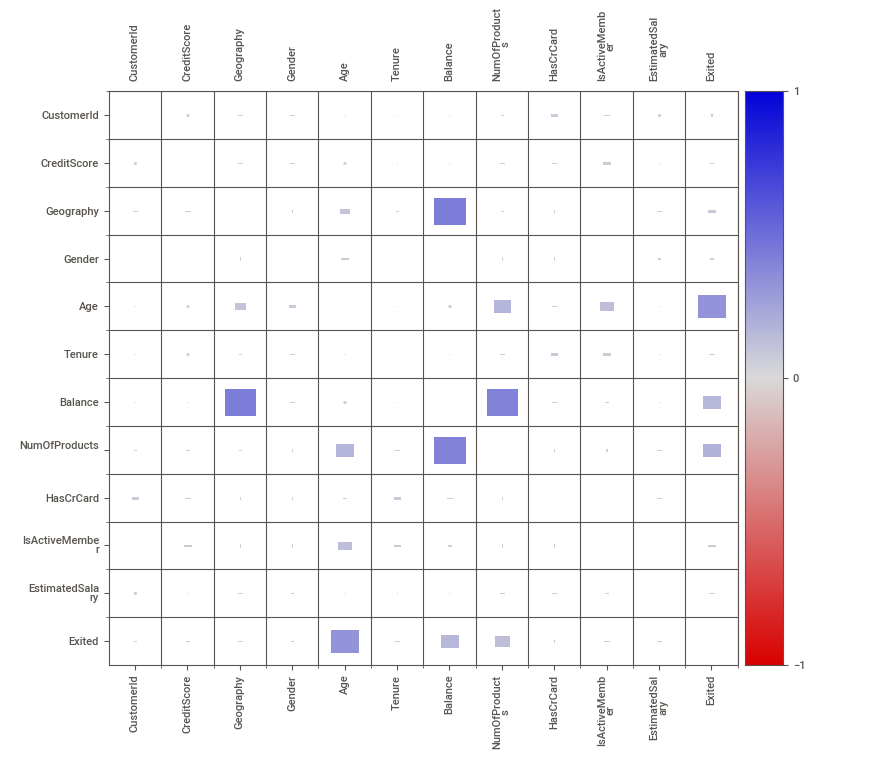

In [51]:
report = sv.compare([tips_NA,"MCAR"],[tips_NA3,"MNAR"])
report.show_notebook() 

                                             |          | [  0%]   00:00 -> (? left)


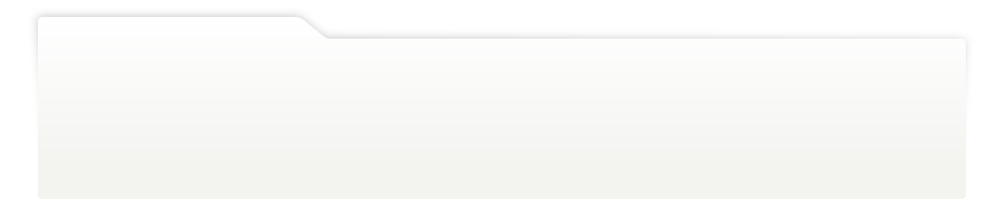
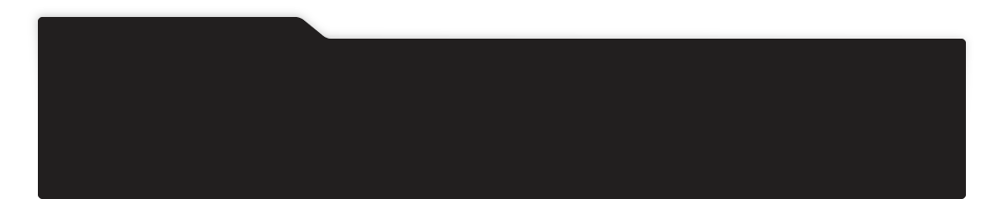
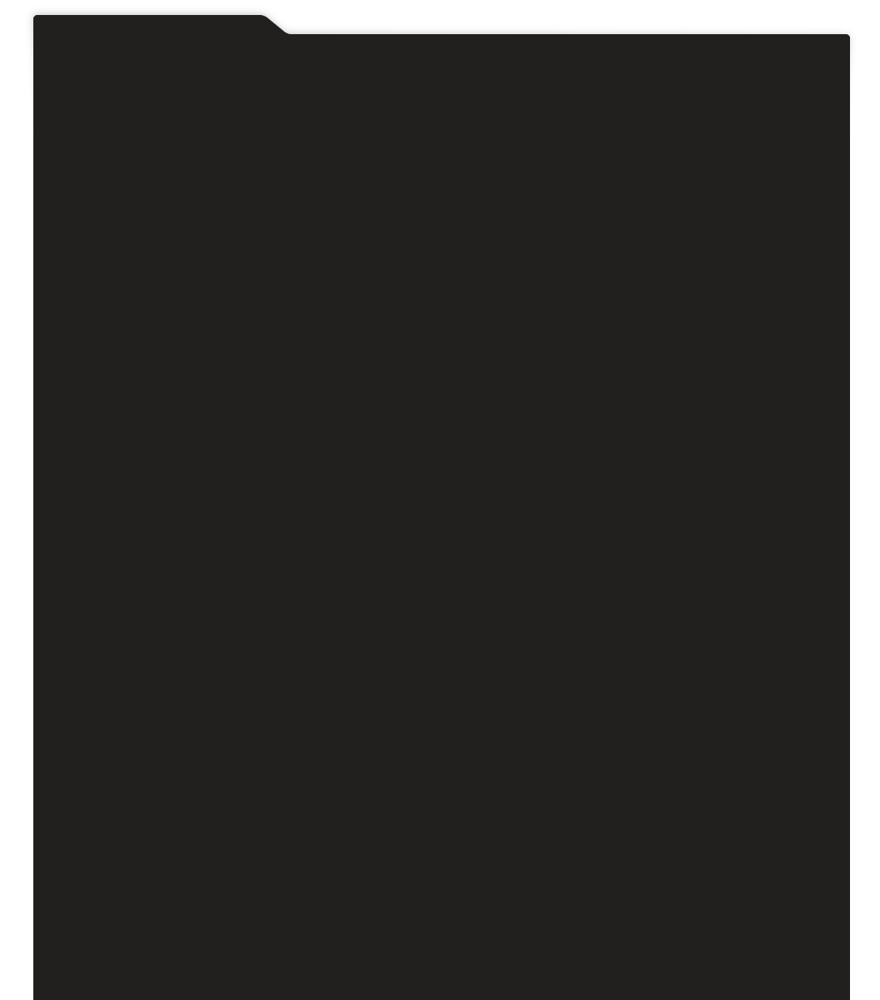
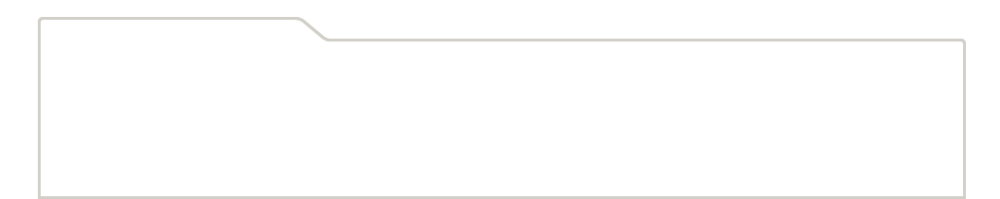
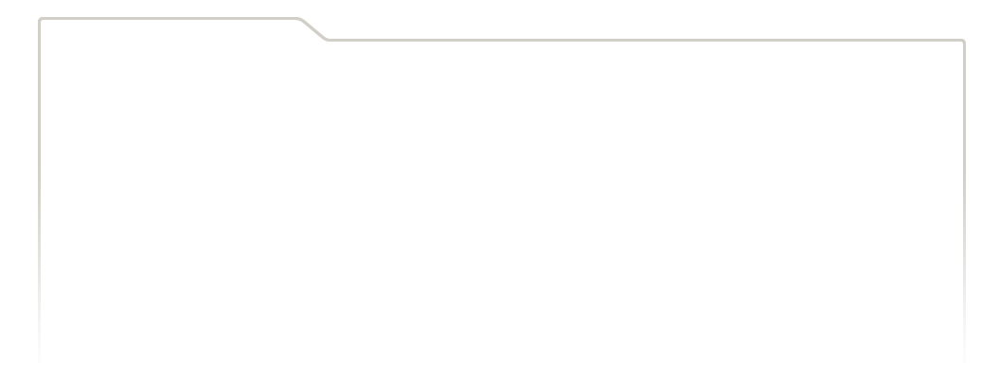
...
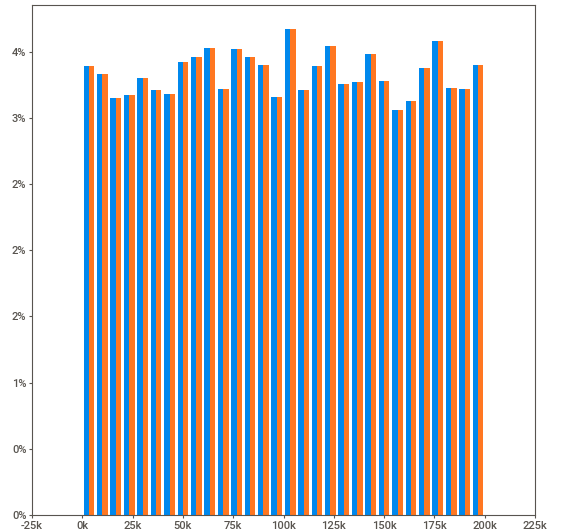
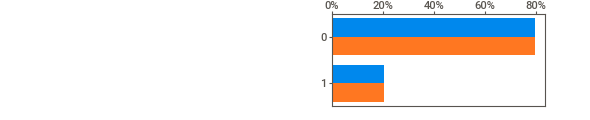
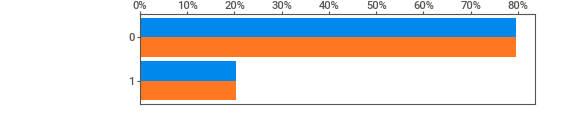
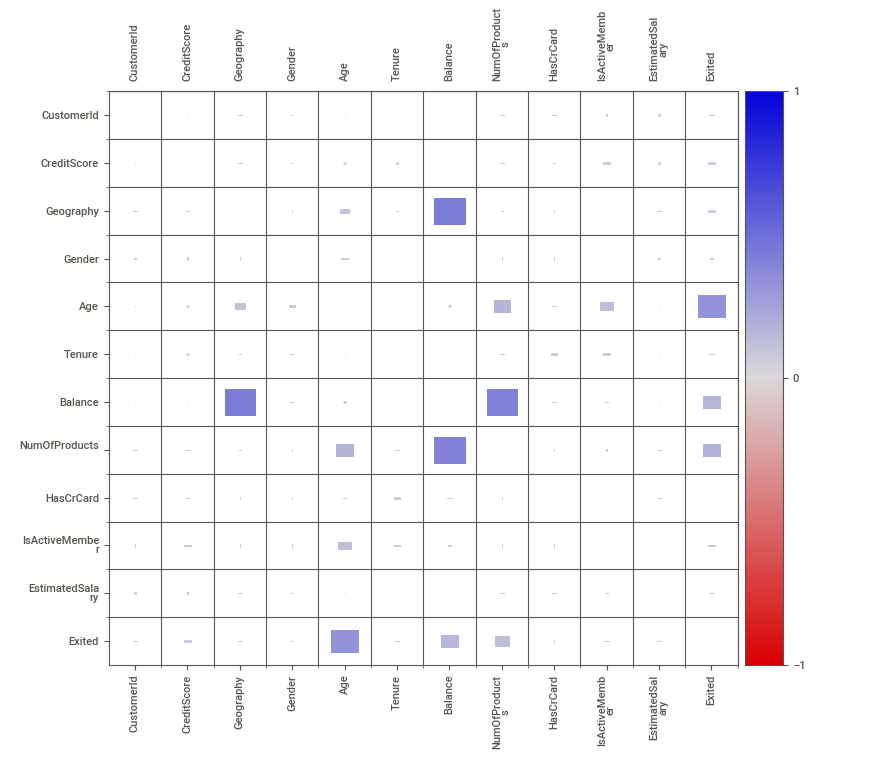
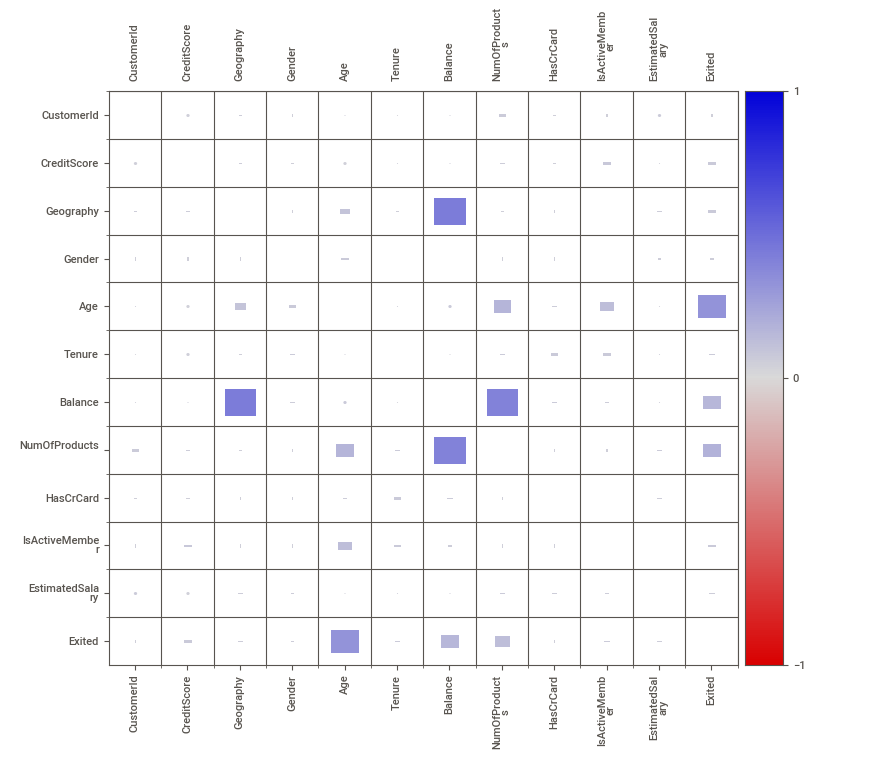

In [52]:
tips_input3 = tips_NA3.fillna(tips_NA3.mean())
report = sv.compare([tips_input,"MCAR"],[tips_input3,"MNAR"])
report.show_notebook()